# Streamlit Dev

## SAVE CONTENT

### Saving Product Metadata

In [1]:
%load_ext autoreload 
%autoreload 2

In [2]:
import pandas as pd

pd.set_option('display.max_columns',100)


##Load in the data
import json
with open("config/filepaths.json") as f:
    FPATHS = json.load(f)


import joblib
df = joblib.load(FPATHS['data']['processed-nlp']['processed-reviews-with-target_joblib'])
df

,asin,reviewerID,reviewText,summary,overall,year,title,brand,category,review-text-full,review-text-full_raw,tokens-dirty,tokens,lemmas,tokens-dirty-joined,tokens-joined,lemmas-joined,target-rating
0,B007JINB0W,A3Y51NV9HU5T2,"Great pasta taste and feel, but the spell in t...",Four Stars,4,2018,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,"Four Stars: Great pasta taste and feel, but th...","Four Stars: Great pasta taste and feel, but th...","[four, stars, great, pasta, taste, and, feel, ...","[stars, great, pasta, taste, feel, spell, pack...","[star, great, pasta, taste, feel, spell, packa...",four stars great pasta taste and feel but the ...,stars great pasta taste feel spell packaged sk...,star great pasta taste feel spell package skrong,None
1,B007JINB0W,A3D7EFSRC6Y9MP,The texture just made it a little strange to e...,Okay but don't like texture,3,2014,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,Okay but don't like texture: The texture just ...,Okay but don't like texture: The texture just ...,"[okay, but, do, n't, like, texture, the, textu...","[okay, like, texture, texture, little, strange...","[okay, like, texture, texture, little, strange...",okay but do n't like texture the texture just ...,okay like texture texture little strange eat f...,okay like texture texture little strange eat f...,None
2,B007JINB0W,A4AM5KBP3I2R,The herb flavor makes the odd texture of shira...,Go for the green noodles,5,2018,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,Go for the green noodles: The herb flavor make...,Go for the green noodles: The herb flavor make...,"[go, for, the, green, noodles, the, herb, flav...","[green, noodles, herb, flavor, makes, odd, tex...","[green, noodle, herb, flavor, make, odd, textu...",go for the green noodles the herb flavor makes...,green noodles herb flavor makes odd texture sh...,green noodle herb flavor make odd texture shir...,High
3,B007JINB0W,A3GHK4IL78DB7Y,I didn't have a problem at all with a half fil...,Its an awesome substitute.,5,2018,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,Its an awesome substitute.: I didn't have a pr...,Its an awesome substitute.: I didn't have a pr...,"[its, an, awesome, substitute, i, did, n't, ha...","[awesome, substitute, problem, half, filled, b...","[awesome, substitute, problem, half, fill, bag...",its an awesome substitute i did n't have a pro...,awesome substitute problem half filled bag use...,awesome substitute problem half fill bag user ...,High
4,B007JINB0W,AH3B94LQOPPY6,They taste like whatever you cook them with.,Five Stars,5,2016,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,Five Stars: They taste like whatever you cook ...,Five Stars: They taste like whatever you cook ...,"[five, stars, they, taste, like, whatever, you...","[stars, taste, like, cook]","[star, taste, like, cook]",five stars they taste like whatever you cook t...,stars taste like cook,star taste like cook,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4358,B007JINB0W,A73IG1ED6S0JR,Product arrived with two of the bags punctured...,would not recomend,1,2016,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,would not recomend: Product arrived with two o...,would not recomend: Product arrived with two o...,"[would, not, recomend, product, arrived, with,...","[recomend, product, arrived, bags, punctured, ...","[recomend, product, arrive, bag, puncture, sme...",would not recomend product arrived with two of...,recomend product arrived bags punctured smells...,recomend product arrive bag puncture smell bad,Low
4359,B007JINB0W,A1XZ2H0MYG54M0,Ok.,Fiv

In [3]:
meta_df = pd.read_csv(FPATHS['data']['subset']['metadata_csv'])
meta_df.head()

,asin,category,description,title,brand,feature,rank,main_cat,price,imageURL,imageURLHighRes,details,Category_Beverages,"Category_Bottled Beverages, Water & Drink Mixes",Category_Candy & Chocolate,"Category_Canned, Jarred & Packaged Foods",Category_Coffee,"Category_Coffee, Tea & Cocoa",Category_Cooking & Baking,Category_Grocery & Gourmet Food,"Category_Herbs, Spices & Seasonings","Category_Sauces, Gravies & Marinades",Category_Snack Foods,Category_Tea,category_list
0,B00BUKL666,Grocery & Gourmet Food; Snack Foods; Bars; Nut...,'These bars are where our journey started and ...,"KIND Bars, Dark Chocolate Nuts &amp; Sea Salt,...",KIND,NaN,18 in Grocery & Gourmet Food (,Grocery,$13.67,'https://images-na.ssl-images-amazon.com/image...,'https://images-na.ssl-images-amazon.com/image...,{'\\n Product Dimensions: \\n ': '6.8 x ...,0,0,0,0,0,0,0,1,0,0,1,0,"['Grocery & Gourmet Food', 'Snack Foods', 'Bar..."
1,B008QMX2SG,Grocery & Gourmet Food; Snack Foods; Bars; Nut...,'These bars are where our journey started and ...,"Kind Bars, Madagascar Vanilla Almond, Gluten F...",KIND,NaN,"2,949 in Grocery & Gourmet Food (",Grocery,$14.79,'https://images-na.ssl-images-amazon.com/image...,'https://images-na.ssl-images-amazon.com/image...,{'\\n Product Dimensions: \\n ': '2 x 4 ...,0,0,0,0,0,0,0,1,0,0,1,0,"['Grocery & Gourmet Food', 'Snack Foods', 'Bar..."
2,B00D3M2QP4,Grocery & Gourmet Food; Breakfast Foods; Break...,'These bars are where our journey started and ...,"KIND Bars, Dark Chocolate Chili Almond, Gluten...",KIND,NaN,"4,575 in Grocery & Gourmet Food (",Grocery,$15.53,'https://images-na.ssl-images-amazon.com/image...,'https://images-na.ssl-images-amazon.com/image...,{'\\n Product Dimensions: \\n ': '7 x 6 ...,0,0,0,0,0,0,0,1,0,0,0,0,"['Grocery & Gourmet Food', 'Breakfast Foods', ..."
3,B00542YXFW,"Grocery & Gourmet Food; Beverages; Coffee, Tea...","'Mild, but round and full licorice flavor and ...","Davidson's Tea Bulk, Anise Seed, 16-Ounce Bag",Davidson's Tea,NaN,"100,853 in Grocery & Gourmet Food (",Grocery,$15.00,'https://images-na.ssl-images-amazon.com/image...,'https://images-na.ssl-images-amazon.com/image...,"{'Shipping Weight:': '1.1 pounds (', 'Domestic...",1,0,0,0,0,1,0,1,0,0,0,1,"['Grocery & Gourmet Food', 'Beverages', 'Coffe..."
4,B000F4DKAI,"Grocery & Gourmet Food; Beverages; Coffee, Tea...",'First started as much needed refreshment betw...,Twinings of London English Afternoon Black Tea...,Twinings,NaN,"19,796 in Grocery & Gourmet Food (",Grocery,$23.70,'https://images-na.ssl-images-amazon.com/image...,'https://images-na.ssl-images-amazon.com/image...,"{'Shipping Weight:': '1.3 pounds (', 'Domestic...",1,0,0,0,0,1,0,1,0,0,0,1,"['Grocery & Gourmet Food', 'Beverages', 'Coffe..."


In [4]:
# Filter for only products in the reivews
product_metadata = meta_df[meta_df['asin'].isin(df['asin'].unique())]
# product_metadata = product_metadata.rename({'category_list':'categories'},axis=1)

product_metadata = product_metadata.reset_index(drop=True)
product_metadata

,asin,category,description,title,brand,feature,rank,main_cat,price,imageURL,imageURLHighRes,details,Category_Beverages,"Category_Bottled Beverages, Water & Drink Mixes",Category_Candy & Chocolate,"Category_Canned, Jarred & Packaged Foods",Category_Coffee,"Category_Coffee, Tea & Cocoa",Category_Cooking & Baking,Category_Grocery & Gourmet Food,"Category_Herbs, Spices & Seasonings","Category_Sauces, Gravies & Marinades",Category_Snack Foods,Category_Tea,category_list
0,B007JINB0W,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,'Nutrition Facts Serving Size: 3 oz Servings P...,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,"'<span class=""a-size-base a-color-secondary"">\...","119,683 in Grocery & Gourmet Food (",Grocery,$59.76,'https://images-na.ssl-images-amazon.com/image...,'https://images-na.ssl-images-amazon.com/image...,"{'\\n Item Weight: \\n ': '3.07 pounds',...",0,0,0,0,0,0,0,1,0,0,0,0,"['Grocery & Gourmet Food', 'Pasta & Noodles', ..."


### Attempting to Get Images (but none show front of product)

In [5]:
product_metadata.loc[0,'title']

'Miracle Noodle Zero Carb, Gluten Free Shirataki Pasta, Spinach Angel Hair, 7-Ounce (Pack of 24)'

In [6]:
import ast

for col in ['imageURL','imageURLHighRes','category_list']:
    product_metadata[col] = product_metadata[col].map(ast.literal_eval)

In [7]:
# Saving series for easy slicing for dictionary
product = product_metadata.loc[0]
product = product.rename({'category_list':'categories'},axis=0)
product

asin                                                                                      B007JINB0W
category                                           Grocery & Gourmet Food; Pasta & Noodles; Noodl...
description                                        'Nutrition Facts Serving Size: 3 oz Servings P...
title                                              Miracle Noodle Zero Carb, Gluten Free Shiratak...
brand                                                                                 Miracle Noodle
feature                                            '<span class="a-size-base a-color-secondary">\...
rank                                                             119,683 in Grocery & Gourmet Food (
main_cat                                                                                     Grocery
price                                                                                         $59.76
imageURL                                           (https://images-na.ssl-images-amazon.com

In [8]:
# img_urls = product_metadata.loc[0, 'imageURL']
img_urls = product['imageURL']
img_urls

('https://images-na.ssl-images-amazon.com/images/I/51RZohgUHBL._SS40_.jpg',
 'https://images-na.ssl-images-amazon.com/images/I/41ZOJudVjHL._SS40_.jpg',
 'https://images-na.ssl-images-amazon.com/images/I/41lVNOnPAhL._SS40_.jpg',
 'https://images-na.ssl-images-amazon.com/images/I/51arfTgAqqL._SS40_.jpg',
 'https://images-na.ssl-images-amazon.com/images/I/51SjLe3XA7L._SS40_.jpg',
 'https://images-na.ssl-images-amazon.com/images/I/41KSrCU7OhL._SS40_.jpg')

In [9]:
# img_urls_hd = product_metadata.loc[0, 'imageURLHighRes']
img_urls_hd = product['imageURLHighRes']
img_urls_hd

('https://images-na.ssl-images-amazon.com/images/I/51RZohgUHBL.jpg',
 'https://images-na.ssl-images-amazon.com/images/I/41ZOJudVjHL.jpg',
 'https://images-na.ssl-images-amazon.com/images/I/41lVNOnPAhL.jpg',
 'https://images-na.ssl-images-amazon.com/images/I/51arfTgAqqL.jpg',
 'https://images-na.ssl-images-amazon.com/images/I/51SjLe3XA7L.jpg',
 'https://images-na.ssl-images-amazon.com/images/I/41KSrCU7OhL.jpg')

In [10]:
# Create subfolder for images
import os
img_folder = "images/selected-products/"
os.makedirs(img_folder, exist_ok=True)

url = img_urls_hd[0]
fname = img_folder + os.path.basename(url)
fname

'images/selected-products/51RZohgUHBL.jpg'

In [11]:
import requests

url = img_urls_hd[0]
resp = requests.get(url)
resp

<Response [200]>

In [12]:
from PIL import Image

- 0) Filename = images/selected-products/51RZohgUHBL.jpg


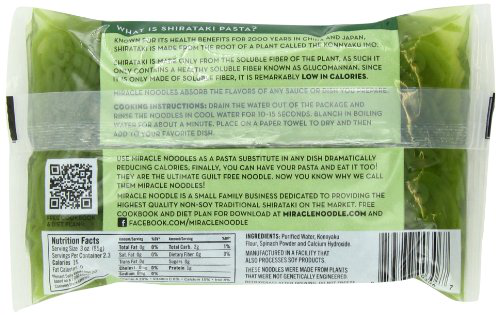

- 1) Filename = images/selected-products/41ZOJudVjHL.jpg


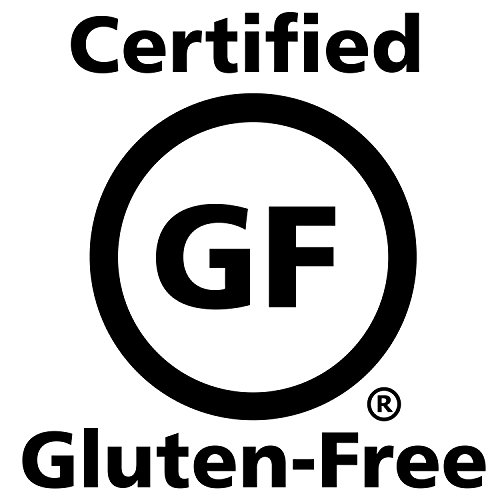

- 2) Filename = images/selected-products/41lVNOnPAhL.jpg


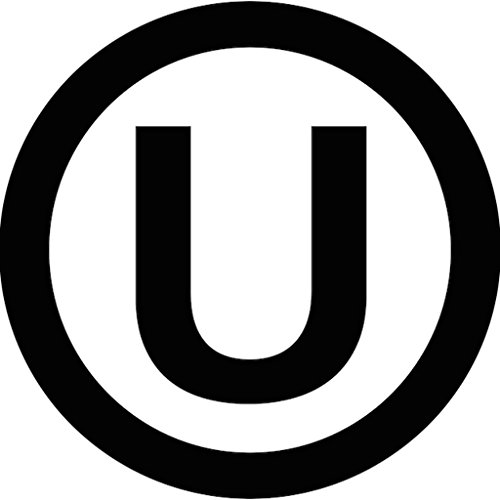

- 3) Filename = images/selected-products/51arfTgAqqL.jpg


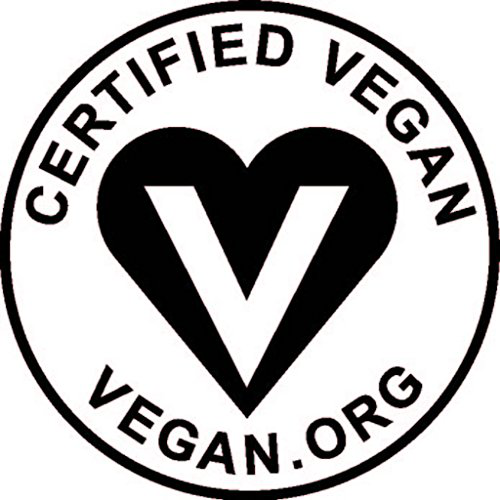

- 4) Filename = images/selected-products/51SjLe3XA7L.jpg


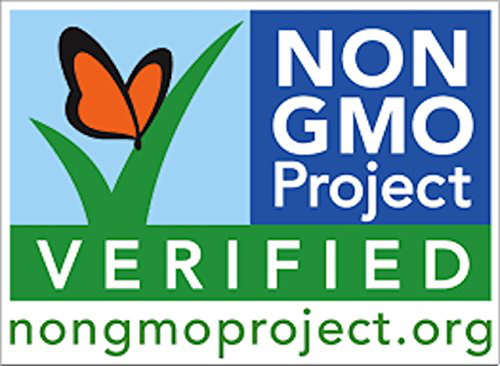

- 5) Filename = images/selected-products/41KSrCU7OhL.jpg


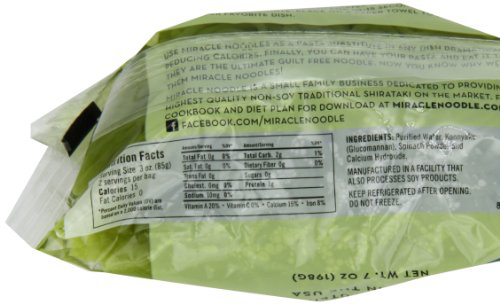

In [13]:
# Save HD images image 
product_img_files = []
for i, url in enumerate(img_urls_hd):
    resp = requests.get(url)
    fname = img_folder + os.path.basename(url)
    
    with open(fname, 'wb') as f:
        f.write(resp.content)

    # save fname for metadata dict
    product_img_files.append(fname)

    print("="*80, f"- {i}) Filename = {fname}",
         "="*80, sep='\n')
    test_img = Image.open(fname)
    display(test_img)

    

> Closest product currently sold: [Miracle Noodle Spinach Angel Hair Pasta](https://www.amazon.com/Miracle-Noodle-Spinach-Angel-Hair/dp/B008Y1J5SA/ref=sr_1_8?crid=1LDESLRDJ55DW&keywords=Miracle+Noodle+Zero+Carb+Shirataki+Pasta+Spinach+Angel+Hair%2C+7-Ounc&qid=1707507310&sprefix=miracle+noodle+zero+carb+shirataki+pasta+%2Caps%2C309&sr=8-8)

<img src="https://m.media-amazon.com/images/W/MEDIAX_849526-T3/images/I/61rLbjL-PzL._SL1500_.jpg">
<a href="https://m.media-amazon.com/images/W/MEDIAX_849526-T3/images/I/61rLbjL-PzL._SL1500_.jpg">Image Source</a>

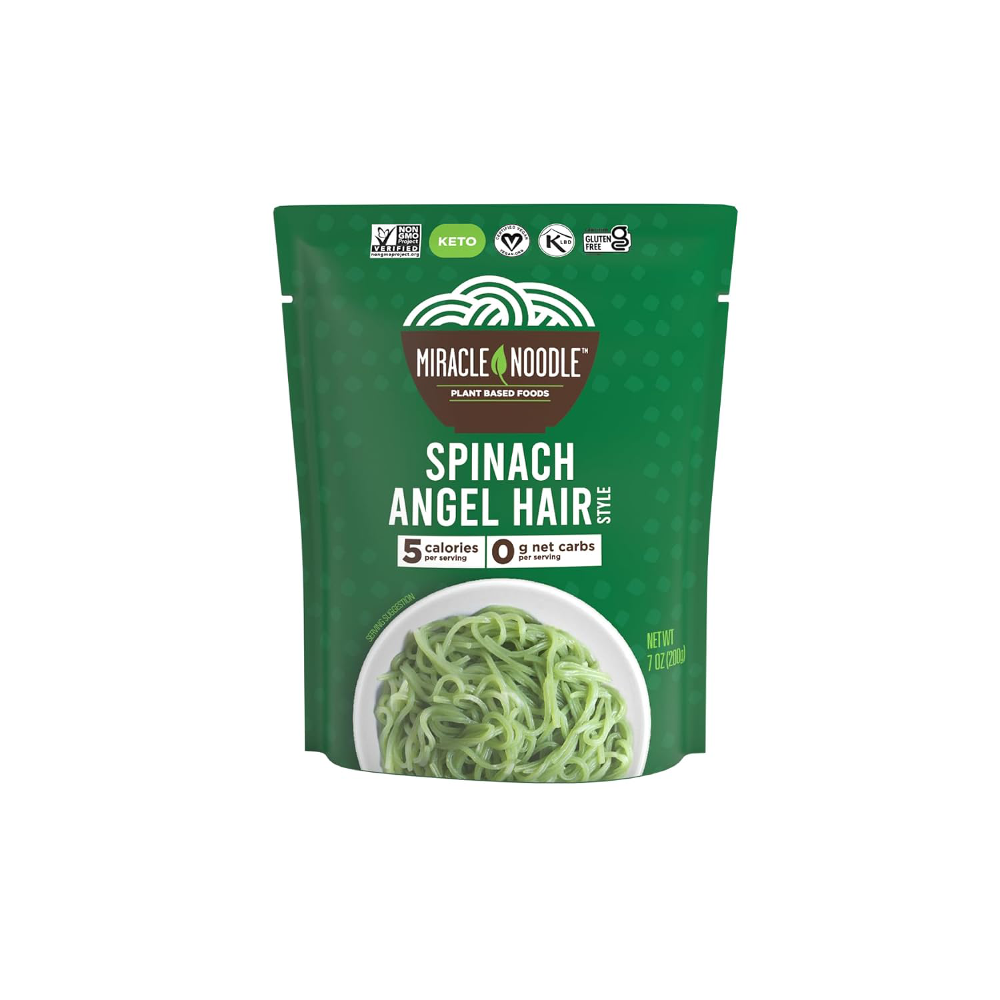

In [14]:
img_url_2024 = "https://m.media-amazon.com/images/W/MEDIAX_849526-T3/images/I/61rLbjL-PzL._SL1500_.jpg"
resp = requests.get(img_url_2024)
# fname = img_folder + os.path.basename(img_url_2024)
fname = 'images/selected-products/miracle-noodle-2024.jpg'

with open(fname, 'wb') as f:
    f.write(resp.content)

# save fname for metadata dict
product_img_files.append(fname)

test_img = Image.open(fname)
display(test_img)


### Construct Final Metadata

In [15]:
# Save final metadata in dict
keep_cols = ['asin','title','description','brand','price','rank', 'categories']
final_metadata = {}
for col in keep_cols:
    value = product[col]
    if isinstance(value,str):
        value = value.strip("(").strip("(").strip("'").strip()
    final_metadata[col] = value

## Adding saved image
final_metadata['product image'] = 'images/selected-products/miracle-noodle-2024.jpg'


In [16]:
# # Add product details
# product_details_raw = ast.literal_eval(product_metadata.loc[0,'details'])
# # product_details = {}
# for k,v in product_details_raw.items():
#     k_clean = k.replace("\\n",' ').strip()
#     k_clean = k_clean.strip(':')
#     if isinstance(v,str):
#         v = v.strip("(").strip("(").strip("'").strip().strip(":")
#     final_metadata[k_clean] = v
#     # product_details[k_clean] =  v
# # product_details.keys()

In [17]:
# final_metadata['details'] = product_details
final_metadata

{'asin': 'B007JINB0W',
 'title': 'Miracle Noodle Zero Carb, Gluten Free Shirataki Pasta, Spinach Angel Hair, 7-Ounce (Pack of 24)',
 'description': "Nutrition Facts Serving Size: 3 oz Servings Per Container: 2.3 Amount Per Serving Calories 0 Calories from Fat 0 Total Fat 0g 0% Protein 0g 0% Protein <1g 0% Sugar 0g 0% Carbohydrate <1g - only fiber Zero Net Carbs, Zero Calories, Zero Glycemic Index Ingredients: Water, glucomannan (soluble fiber), calcium additive. No soy, gluten, or wheat! Kosher', 'Manufactured in a facility that also processes soy products. . This product is labelled to United States standards and may differ from similar products sold elsewhere in its ingredients, labeling and allergen warnings', 'No soy, gluten or wheat', 'Water, glucomannan (fiber), Spinach Powder, calcium additive.', 'Cooking instructions: drain the water out of the package and rinse the noodles in cool water for 10-15 seconds. Blanch in boiling water for about a minute. Place on a paper towel to dr

In [18]:
# Add image files
final_metadata['image_files'] = product_img_files
final_metadata

{'asin': 'B007JINB0W',
 'title': 'Miracle Noodle Zero Carb, Gluten Free Shirataki Pasta, Spinach Angel Hair, 7-Ounce (Pack of 24)',
 'description': "Nutrition Facts Serving Size: 3 oz Servings Per Container: 2.3 Amount Per Serving Calories 0 Calories from Fat 0 Total Fat 0g 0% Protein 0g 0% Protein <1g 0% Sugar 0g 0% Carbohydrate <1g - only fiber Zero Net Carbs, Zero Calories, Zero Glycemic Index Ingredients: Water, glucomannan (soluble fiber), calcium additive. No soy, gluten, or wheat! Kosher', 'Manufactured in a facility that also processes soy products. . This product is labelled to United States standards and may differ from similar products sold elsewhere in its ingredients, labeling and allergen warnings', 'No soy, gluten or wheat', 'Water, glucomannan (fiber), Spinach Powder, calcium additive.', 'Cooking instructions: drain the water out of the package and rinse the noodles in cool water for 10-15 seconds. Blanch in boiling water for about a minute. Place on a paper towel to dr

In [19]:
final_metadata.keys()

dict_keys(['asin', 'title', 'description', 'brand', 'price', 'rank', 'categories', 'product image', 'image_files'])

In [20]:
final_meta_df = pd.DataFrame([final_metadata])
final_meta_df = final_meta_df.set_index('asin')
final_meta_df

,title,description,brand,price,rank,categories,product image,image_files
asin,,,,,,,,
B007JINB0W,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Nutrition Facts Serving Size: 3 oz Servings Pe...,Miracle Noodle,$59.76,"119,683 in Grocery & Gourmet Food","[Grocery & Gourmet Food, Pasta & Noodles, Nood...",images/selected-products/miracle-noodle-2024.jpg,"[images/selected-products/51RZohgUHBL.jpg, ima..."


### Making a Cleaner display title

In [21]:
final_meta_df['title (raw)'] =final_meta_df['title']#.replace(', ','\n ')
final_meta_df['title'] =final_meta_df.iloc[0]['title (raw)'].replace(', ','\n ')
final_meta_df

,title,description,brand,price,rank,categories,product image,image_files,title (raw)
asin,,,,,,,,,
B007JINB0W,Miracle Noodle Zero Carb\n Gluten Free Shirata...,Nutrition Facts Serving Size: 3 oz Servings Pe...,Miracle Noodle,$59.76,"119,683 in Grocery & Gourmet Food","[Grocery & Gourmet Food, Pasta & Noodles, Nood...",images/selected-products/miracle-noodle-2024.jpg,"[images/selected-products/51RZohgUHBL.jpg, ima...","Miracle Noodle Zero Carb, Gluten Free Shiratak..."


In [22]:
formatted_df  = final_meta_df.copy()
formatted_df.columns = [c.replace("_",' ').title() for c in formatted_df.columns]
formatted_df

,Title,Description,Brand,Price,Rank,Categories,Product Image,Image Files,Title (Raw)
asin,,,,,,,,,
B007JINB0W,Miracle Noodle Zero Carb\n Gluten Free Shirata...,Nutrition Facts Serving Size: 3 oz Servings Pe...,Miracle Noodle,$59.76,"119,683 in Grocery & Gourmet Food","[Grocery & Gourmet Food, Pasta & Noodles, Nood...",images/selected-products/miracle-noodle-2024.jpg,"[images/selected-products/51RZohgUHBL.jpg, ima...","Miracle Noodle Zero Carb, Gluten Free Shiratak..."


In [23]:
# @st.cache_data
def display_metadata(meta_df,iloc=0):
    product = meta_df.iloc[iloc]
    md = "#### Product Being Reviewed"
    md = ""
    md += f'\n- Product Title:\n\n***\"{product["Title (Raw)"]}\"***'
    md += f"<p><img src='{product['Product Image']}' width=300px></p>"
    md += f'\n- Brand: {product["Brand"]}'
    md += f"\n- Price: {product['Price']}"
    md += f"\n- Ranked {product['Rank']} (2018)"

    md += f"\n- Categories:\n    - "
    md += "; ".join(product['Categories'])
    # md += f"\n- Categories:{', '.join(product['Categories'])}"
    
    
    return md

# col1.markdown(display_metadata(meta_df))
# col2.image(product['Product Image'],width=300)
md_text = display_metadata(formatted_df)
md_text


'\n- Product Title:\n\n***"Miracle Noodle Zero Carb, Gluten Free Shirataki Pasta, Spinach Angel Hair, 7-Ounce (Pack of 24)"***<p><img src=\'images/selected-products/miracle-noodle-2024.jpg\' width=300px></p>\n- Brand: Miracle Noodle\n- Price: $59.76\n- Ranked 119,683 in Grocery & Gourmet Food (2018)\n- Categories:\n    - Grocery & Gourmet Food; Pasta & Noodles; Noodles; Shirataki'

In [24]:
fpath_md = FPATHS['metadata']['product-information_md']
with open(fpath_md, 'w') as f:
    f.write(md_text)

In [25]:
from IPython.display import Markdown
fpath_md = FPATHS['metadata']['product-information_md']
with open(fpath_md) as f:
    display(Markdown(f.read()))


- Product Title:

***"Miracle Noodle Zero Carb, Gluten Free Shirataki Pasta, Spinach Angel Hair, 7-Ounce (Pack of 24)"***<p><img src='images/selected-products/miracle-noodle-2024.jpg' width=300px></p>
- Brand: Miracle Noodle
- Price: $59.76
- Ranked 119,683 in Grocery & Gourmet Food (2018)
- Categories:
    - Grocery & Gourmet Food; Pasta & Noodles; Noodles; Shirataki

In [26]:
# product_details_raw = ast.literal_eval(product_metadata.loc[0,'details'])
# product_details = {}
# for k,v in product_details_raw.items():
#     k_clean = k.replace("\\n",'').strip()
#     product_details[k_clean] =  v
# product_details.keys()

#### Save Cleaned Metadata

In [27]:
## Cleaning Column names

final_meta_df.columns = [c.replace("_",' ').title() for c in final_meta_df.columns]
final_meta_df

,Title,Description,Brand,Price,Rank,Categories,Product Image,Image Files,Title (Raw)
asin,,,,,,,,,
B007JINB0W,Miracle Noodle Zero Carb\n Gluten Free Shirata...,Nutrition Facts Serving Size: 3 oz Servings Pe...,Miracle Noodle,$59.76,"119,683 in Grocery & Gourmet Food","[Grocery & Gourmet Food, Pasta & Noodles, Nood...",images/selected-products/miracle-noodle-2024.jpg,"[images/selected-products/51RZohgUHBL.jpg, ima...","Miracle Noodle Zero Carb, Gluten Free Shiratak..."


In [28]:
fpath_meta = FPATHS['data']['app']['product-metadata_json']
final_meta_df.to_json(fpath_meta)

In [29]:
pd.read_json(fpath_meta)

,Title,Description,Brand,Price,Rank,Categories,Product Image,Image Files,Title (Raw)
B007JINB0W,Miracle Noodle Zero Carb\n Gluten Free Shirata...,Nutrition Facts Serving Size: 3 oz Servings Pe...,Miracle Noodle,$59.76,"119,683 in Grocery & Gourmet Food","[Grocery & Gourmet Food, Pasta & Noodles, Nood...",images/selected-products/miracle-noodle-2024.jpg,"[images/selected-products/51RZohgUHBL.jpg, ima...","Miracle Noodle Zero Carb, Gluten Free Shiratak..."


In [30]:
# print(product_metadata.loc[0,'feature'])

In [31]:
# from bs4 import BeautifulSoup
# feature_soup = BeautifulSoup(product_metadata.loc[0,'feature'])
# print(feature_soup.prettify())
# # feature_soup.find_all('span', 'text')

# APP CODE

In [32]:
import streamlit as st
import streamlit.components.v1 as components
import pandas as pd
import numpy as np
import os
import joblib
import tensorflow as tf
from PIL import Image
import custom_functions as fn

# Get Fpaths
@st.cache_data
def get_app_fpaths(fpath='config/filepaths.json'):
	import json
	with open(fpath ) as f:
		return json.load(f)



##Load in the data
import json
with open("config/filepaths.json") as f:
    FPATHS = json.load(f)
    
st.header("Exploratory Data Analysis of Amazon Reviews ")

if st.checkbox('[Dev] Show FPATHS?',value=False):
    FPATHS
    

2024-02-12 20:37:57.973 WARNING streamlit.runtime.caching.cache_data_api: No runtime found, using MemoryCacheStorageManager
2024-02-12 20:37:58.263 
  command:

    streamlit run /opt/homebrew/Caskroom/miniforge/base/envs/dojo-env/lib/python3.10/site-packages/ipykernel_launcher.py [ARGUMENTS]


In [33]:
@st.cache_data    
def load_df(fpath):
    import joblib
    return joblib.load(fpath)

@st.cache_data
def load_metadata(fpath):
    import pandas as pd
    return pd.read_json(fpath)

df = load_df(FPATHS['data']['processed-nlp']['processed-reviews-with-target_joblib'])
meta_df = load_metadata(FPATHS['data']['app']['product-metadata_json'])
product= meta_df.iloc[0]


2024-02-12 20:37:58.317 No runtime found, using MemoryCacheStorageManager
2024-02-12 20:37:58.318 No runtime found, using MemoryCacheStorageManager
2024-02-12 20:37:58.319 No runtime found, using MemoryCacheStorageManager
2024-02-12 20:37:58.493 No runtime found, using MemoryCacheStorageManager


In [34]:
# def display_metadata(meta_df,iloc=0):
#     product = meta_df.iloc[iloc]
#     md = "### Product Being Reviewed"
#     md += f'\n- Product Title:\n***\"{product["Title (Raw)"]}\"***'
#     md += f"<p><img src='{product['Product Image']}' width=300px></p>"
#     md += f'\n- Brand: {product["Brand"]}'
#     md += f"\n- Price: {product['Price']}"
#     md += f"\n- Ranked {product['Rank']} (2018)"

#     md += f"\n- Categories:\n    - "
#     md += "; ".join(product['Categories'])
#     # md += f"\n- Categories:{', '.join(product['Categories'])}"
    
    
#     return md

# from IPython.display import Markdown
# Markdown(display_metadata(meta_df))

In [35]:

if st.sidebar.checkbox("Show Product Information", value=True):
    st.subheader("Product Being Reviewed")

    col1,col2 = st.columns(2)

    # @st.cache_data
    def display_metadata(meta_df,iloc=0):
        product = meta_df.iloc[iloc]
        # md = "#### Product Being Reviewed"
        md = ""
        md += f'\n- Product Title:\n***\"{product["Title (Raw)"]}\"***'
        # md += f"<p><img src='{product['Product Image']}' width=300px></p>"
        md += f'\n- Brand: {product["Brand"]}'
        md += f"\n- Price: {product['Price']}"
        md += f"\n- Ranked {product['Rank']} (2018)"

        md += f"\n- Categories:\n    - "
        md += "; ".join(product['Categories'])
        # md += f"\n- Categories:{', '.join(product['Categories'])}"
    
        return md

    col1.markdown(display_metadata(meta_df))
    col2.image(product['Product Image'],width=300)
else:
    col1,col2 =st.columns(2)
    col1.empty()
    col2.empty()


In [36]:
# display(meta_df)
# df.head()

In [37]:
import plotly.express as px
import plotly.io as pio
pio.templates.default=None

In [38]:
# # label: color
# color_dict = {
#     1: "red",
#     2: "red",
#     3: "gray",
#     4:'gray',
#     5:'green'}


In [39]:
## Source: chat with ChatGPT 
import matplotlib.colors as mcolors

# def mute_color(color_name):
#     # Convert CSS color name to RGB
#     rgb = mcolors.to_rgb(color_name)
    
#     # Convert RGB to HSL
#     h, l, s = mcolors.rgb_to_hsv(rgb)
    
#     # Decrease saturation to mute the color, adjust lightness if necessary
#     muted_hls = (h, max(0, min(l * 1.2, 1)), s * 0.5)  # Example adjustment
    
#     # Convert back to RGB
#     muted_rgb = mcolors.hsv_to_rgb(muted_hls)
    
#     # Convert RGB back to Hex for CSS
#     muted_hex = mcolors.to_hex(muted_rgb)
    
#     return muted_hex

def mute_color(color_name, saturation_adjustment=0.5, lightness_adjustment=1.2):
    """
    Mutes a given CSS color name.

    Parameters:
    - color_name: The name of the CSS color to be muted.
    - saturation_adjustment: Factor to adjust the color's saturation. 
                              Values < 1 decrease saturation; values > 1 increase it.
    - lightness_adjustment: Factor to adjust the color's lightness.
                            Values < 1 make the color darker; values > 1 make it lighter.

    Returns:
    - muted_hex: The hexadecimal representation of the muted color.
    """
    # Convert CSS color name to RGB
    rgb = mcolors.to_rgb(color_name)
    
    # Convert RGB to HSL
    h, l, s = mcolors.rgb_to_hsv(rgb)
    
    # Adjust saturation and lightness
    adjusted_hls = (h, max(0, min(l * lightness_adjustment, 1)), max(0, min(s * saturation_adjustment, 1)))
    
    # Convert back to RGB
    adjusted_rgb = mcolors.hsv_to_rgb(adjusted_hls)
    
    # Convert RGB back to Hex for CSS
    adjusted_hex = mcolors.to_hex(adjusted_rgb)
    
    return adjusted_hex

In [40]:
# CSS color names to mute
colors = {
    1: "red",
    2: "darkorange",
    3: "yellow",
    4: "green",
    5: "limegreen"
}


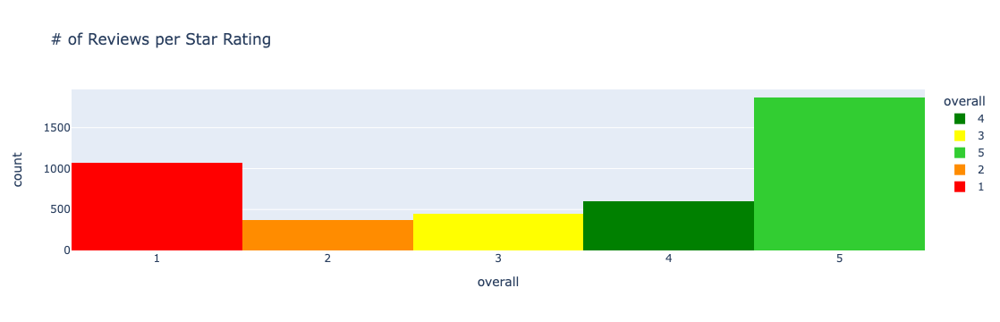

In [41]:
pfig = px.histogram(df, 'overall', color='overall',title='# of Reviews per Star Rating',color_discrete_map=colors)
pfig

In [42]:
def mute_colors_by_key(colors_dict, 
                       saturation_adj=.5,
                       lightness_adj=1.2, 
                       keys_to_mute = [],
                      colors_to_mute=[]):
    """
    Params:
    - colors_dict: Dictionary of css color names.
    - saturation_adj: Factor to adjust the color's saturation. 
                              Values < 1 decrease saturation; values > 1 increase it.
    - lightness_adj: Factor to adjust the color's lightness.
                            Values < 1 make the color darker; values > 1 make it lighter.
    - keys_to_mute: Either list of keys from colors_dict or None to apply to all colors
    - colors_to_mute: Color values in the dictionary to be muted.
    
    Exception raised if both keys_to_mute and colors_to_mute are empty.
    """
    if keys_to_mute is None:
        keys_to_mute = colors_dict.keys()
        
    if (len(keys_to_mute) == 0 ) & (len(colors_to_mute)==0):
        raise Exception("Must provie either keys_to_mute or colors_to_mute")
    # colors_to_mute = []
    muted_colors = {}
    for k,v in colors_dict.items():
        
        if (k in keys_to_mute) | (v in colors_to_mute):
            v = mute_color(v,
                             saturation_adjustment=saturation_adj,
                             lightness_adjustment=lightness_adj)
        muted_colors[k] = v
    return muted_colors

In [43]:
muted_colors = mute_colors_by_key(colors,keys_to_mute=None, saturation_adj=.7, lightness_adj=3)
muted_colors

{1: '#b20000', 2: '#b26200', 3: '#b2b200', 4: '#005a00', 5: '#009000'}

In [44]:
FPATHS['readme']['histogram-reviews-dist_png']

'images/01_histogram_reviews.png'

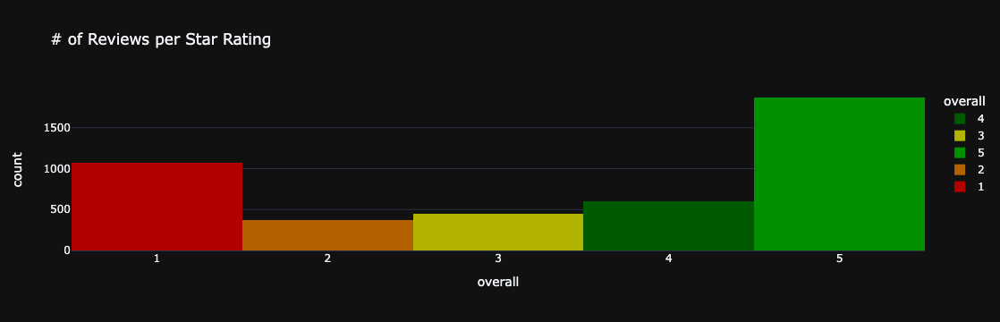

In [45]:
pfig = px.histogram(df, 'overall', color='overall',title='# of Reviews per Star Rating',
                    # color_discrete_map=mute_colors_by_key(colors, keys_to_mute=[3,4],
                    #                                       saturation_adj=.5,lightness_adj=1.2,)
                   color_discrete_map=muted_colors, width=800, template='plotly_dark')

pfig#.#to_image()

In [46]:
fname_histogram = FPATHS['readme']['histogram-reviews-dist_png']
# pfig#.#to_image()
with open(fname_histogram,'wb') as f:
    f.write(pfig.to_image('png'))

In [47]:
fname_histogram

'images/01_histogram_reviews.png'

![png](images/01_histogram_reviews.png)

In [48]:
ratings_by_year  = df.groupby('year',as_index=False)['overall'].value_counts(normalize=True)
ratings_by_year

,year,overall,proportion
0,2012,5,0.666667
1,2012,3,0.333333
2,2013,5,0.454167
3,2013,4,0.195833
4,2013,1,0.154167
5,2013,2,0.100000
6,2013,3,0.095833
7,2014,5,0.475758
8,2014,1,0.172727
9,2014,4,0.150000


In [49]:
# px.bar(ratings_by_year, x='year', y='proportion',color='overall', color_discrete_map=muted_colors)

In [50]:
avg_rating_by_year  = df.groupby('year',#as_index=False
                                )[['overall']].mean().sort_index()#sort_values('year')

avg_rating_by_year = avg_rating_by_year.rename({'overall':"Average Rating"},axis=1)
avg_rating_by_year

,Average Rating
year,
2012,4.333333
2013,3.695833
2014,3.675758
2015,3.632118
2016,3.575061
2017,3.170020
2018,3.018445


In [51]:

plot_df = df.rename({'overall':'Rating Counts'},axis=1)
count_ratings_by_year  = plot_df.groupby('year',#as_index=False
                                   )['Rating Counts'].value_counts(normalize=True).sort_index()
# count_ratings_by_year =count_ratings_by_year.rename('Rating Counts')
count_ratings_by_year = count_ratings_by_year.unstack(1).sort_index().fillna(0)
count_ratings_by_year

Rating Counts,1,2,3,4,5
year,,,,,
2012,0.000000,0.000000,0.333333,0.000000,0.666667
2013,0.154167,0.100000,0.095833,0.195833,0.454167
2014,0.172727,0.080303,0.121212,0.150000,0.475758
2015,0.200456,0.062642,0.112756,0.152620,0.471526
2016,0.208232,0.088378,0.094431,0.138015,0.470944
2017,0.320926,0.075453,0.100604,0.118712,0.384306
2018,0.332016,0.114625,0.093544,0.122530,0.337286


In [52]:
def get_rating_percent_by_year(df, melted=False, melted_value_name ="%", melted_var_name="Stars"):
    
    plot_df = df.rename({'overall':'Rating Proportion'},axis=1)
    count_ratings_by_year  = plot_df.groupby('year',#as_index=False
                                       )['Rating Proportion'].value_counts(normalize=True).sort_index()
    
    count_ratings_by_year = count_ratings_by_year.unstack(1).sort_index().fillna(0)

    if melted==True:
        count_ratings_by_year = pd.melt(count_ratings_by_year.reset_index(drop=False),
                                        id_vars=['year'],
                                        value_name=melted_value_name,
                                        var_name=melted_var_name)
    return count_ratings_by_year

In [53]:
counts_by_year=  get_rating_percent_by_year(df)
counts_by_year

Rating Proportion,1,2,3,4,5
year,,,,,
2012,0.000000,0.000000,0.333333,0.000000,0.666667
2013,0.154167,0.100000,0.095833,0.195833,0.454167
2014,0.172727,0.080303,0.121212,0.150000,0.475758
2015,0.200456,0.062642,0.112756,0.152620,0.471526
2016,0.208232,0.088378,0.094431,0.138015,0.470944
2017,0.320926,0.075453,0.100604,0.118712,0.384306
2018,0.332016,0.114625,0.093544,0.122530,0.337286


In [54]:
# counts_by_year=  get_rating_percent_by_year(df)
# counts_by_year

In [55]:
melted_counts_by_year = get_rating_percent_by_year(df, melted=True)
melted_counts_by_year

,year,Stars,%
0,2012,1,0.000000
1,2013,1,0.154167
2,2014,1,0.172727
3,2015,1,0.200456
4,2016,1,0.208232
5,2017,1,0.320926
6,2018,1,0.332016
7,2012,2,0.000000
8,2013,2,0.100000
9,2014,2,0.080303


<Axes: xlabel='year'>

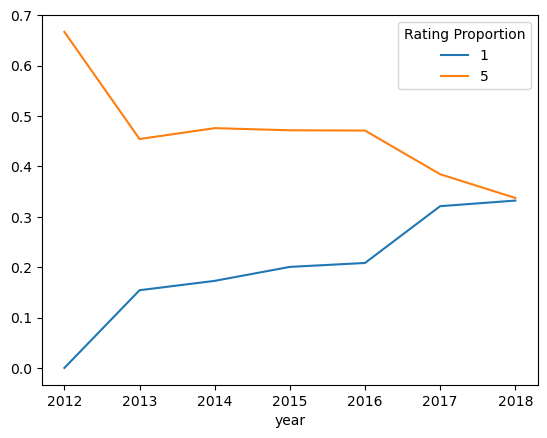

In [56]:
counts_by_year[[1,5]].plot()

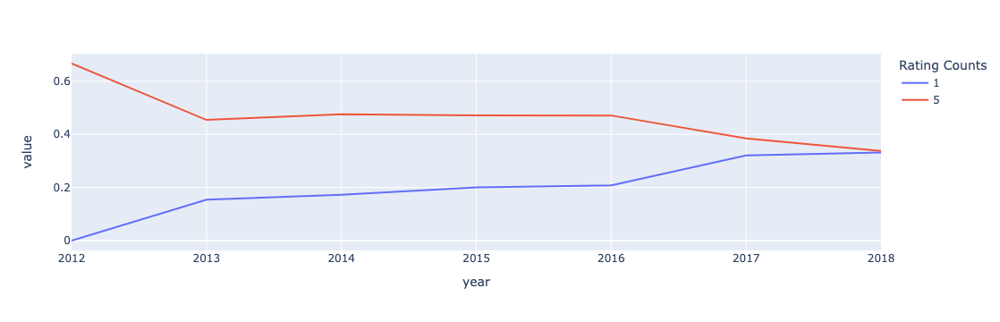

In [57]:
px.line(count_ratings_by_year[[1,5]])#.plot()

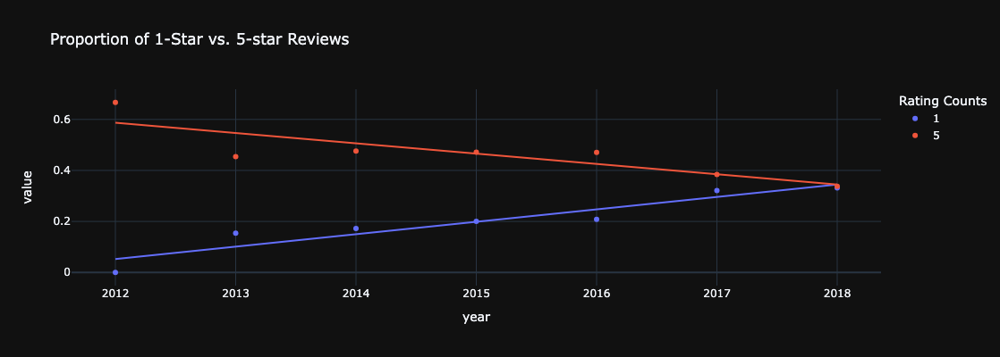

In [58]:
pfig = px.scatter(count_ratings_by_year[[1,5]], trendline='ols', width = 800, height=400,template='plotly_dark',
           title='Proportion of 1-Star vs. 5-star Reviews')
pfig

In [59]:
fname_counts = FPATHS['readme']['number-reviews-stars-by-year_png']
# pfig#.#to_image()
with open(fname_counts,'wb') as f:
    f.write(pfig.to_image('png'))

In [60]:
Markdown(f"![png]({fname_counts})")

![png](images/03_count_stars_by_year.png)

In [61]:
melted_counts_by_year = get_rating_percent_by_year(df, melted=True)
melted_counts_by_year

,year,Stars,%
0,2012,1,0.000000
1,2013,1,0.154167
2,2014,1,0.172727
3,2015,1,0.200456
4,2016,1,0.208232
5,2017,1,0.320926
6,2018,1,0.332016
7,2012,2,0.000000
8,2013,2,0.100000
9,2014,2,0.080303


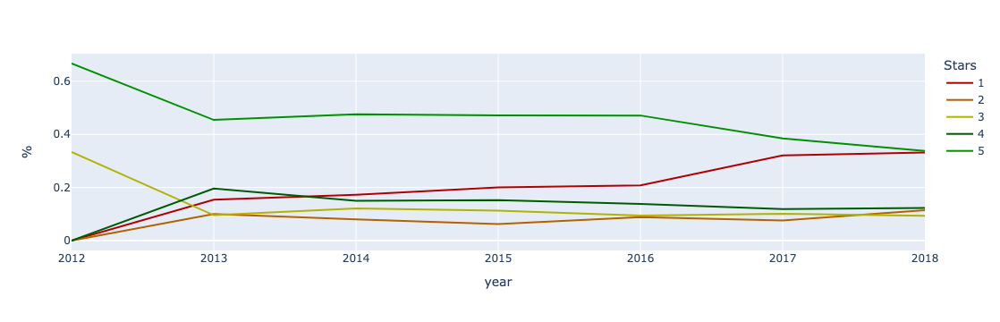

In [62]:
px.line(melted_counts_by_year,x='year',y='%',color="Stars",color_discrete_map=muted_colors,#[stars_to_plot], 
                        # category_orders =[1,5]
       )#[stars_to_plot]))


In [63]:
# px.s

In [64]:
def get_average_rating_by_year(df):
    avg_rating_by_year  = df.groupby('year',
                                )[['overall']].mean().sort_index()

    avg_rating_by_year = avg_rating_by_year.rename({'overall':"Average Rating"},axis=1)
    return avg_rating_by_year

In [65]:
avg_by_year = get_average_rating_by_year(df)
avg_by_year

,Average Rating
year,
2012,4.333333
2013,3.695833
2014,3.675758
2015,3.632118
2016,3.575061
2017,3.170020
2018,3.018445


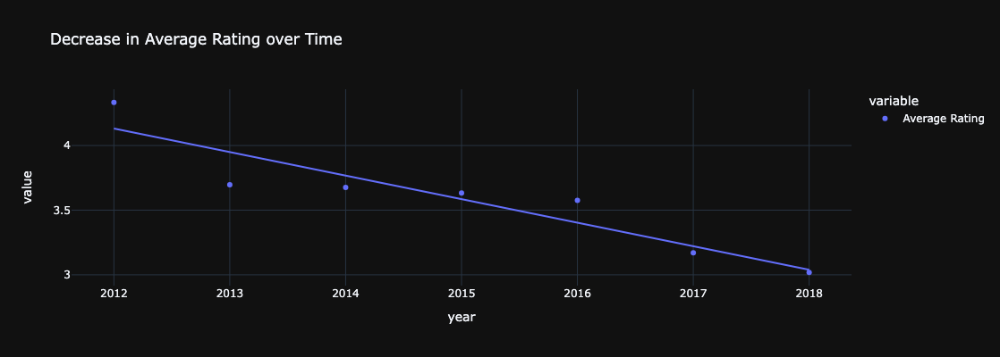

In [66]:
pfig = px.scatter(avg_by_year, trendline='ols', width=800, height=400, template='plotly_dark', title="Decrease in Average Rating over Time",
            )
pfig

In [67]:
fname_avg_reviews = FPATHS['readme']['avg-reviews-by-year_png']
# pfig#.#to_image()
with open(fname_avg_reviews,'wb') as f:
    f.write(pfig.to_image('png'))

In [68]:
Markdown(f"![png]({fname_avg_reviews})")

![png](images/02_avg_rating_by_year.png)

In [69]:
# os.environ['OPENAI_API_KEY']

In [70]:
# pd.concat([avg_rating_by_year,count_ratings_by_year],axis=1)

In [71]:
# pd.melt(counts_by_year, value_name="%", var_name='Stars')

In [72]:
# px.bar(avg_rating_by_year,x='year',y='overall',color='year')

In [73]:
# px.line(df, x='year',y='overall',line_group='color)

# Ngrams

In [74]:
help(fn.compare_ngram_measures_df)

Help on function compare_ngram_measures_df in module custom_functions:

compare_ngram_measures_df(group1_tokens, group2_tokens, ngrams=2, measure='raw_freq', min_freq=1, top_n=25, words_colname='Words', group1_name=None, group2_name=None, multi_index=True)
    Compare 2 groups ngrams side-by-side



# Interactive Wordclouds

In [75]:
df.columns

Index(['asin', 'reviewerID', 'reviewText', 'summary', 'overall', 'year',
       'title', 'brand', 'category', 'review-text-full',
       'review-text-full_raw', 'tokens-dirty', 'tokens', 'lemmas',
       'tokens-dirty-joined', 'tokens-joined', 'lemmas-joined',
       'target-rating'],
      dtype='object')

In [76]:
# from

### from freqdist

In [77]:
# Test code before function
df_for_groups = df.dropna(subset=['target-rating'])
for group in df_for_groups['target-rating'].unique():
    print(group)

High
Low


In [78]:
# import nltk 
# from wordcloud import STOPWORDS
# def get_groups_freqs_wordclouds(df,ngrams=1, group_col='target-rating',
#                               text_col='review-text-full',as_freqs=True,as_tokens=False, tokenizer=nltk.casual_tokenize,
#                              drop_groups=[], stopwords=[*STOPWORDS], ):#, return_tokens = False):
#     """Get single string for each group for wordClouds
#     Note: text_col must contain strings, not lists of tokens. 
#     """
#     group_texts  = {}
#     # Remove unwanted groups
#     df = df[~df[group_col].isin(drop_groups)]

#     # Loop through remaining groups
#     for group_name in df[group_col].unique():
#         filter_group = df[group_col] == group_name

#         if filter_group.sum() == 0:
#             continue
#         # Save filtered dataframe and reset index for test_value
#         group_df = df[filter_group].reset_index(drop=True)
#         test_value = group_df.loc[0, text_col]

#         # Combine list columns of test value is a list
#         if isinstance(test_value,list):
#             group_df[text_col] =  group_df[text_col].map(lambda x: " ".join(x))
            
        
#         # Join together final text
#         joined_text  =  " ".join(group_df[text_col])

#         ## Get freqs
#         if (as_tokens == True) | (as_freqs==True):
#             group_tokens = tokenizer(joined_text)
#             # Remove stopwords and get freqs
#             group_tokens = [w.lower() for w in group_tokens if w.lower() not in stopwords]
    
            
#             if as_freqs==True:
                
#                 if ngrams >1:
#                     group_tokens = nltk.ngrams(group_tokens, ngrams)

#                     # group_tokens = 
#                     for i,word_tuple in enumerate(group_tokens):
                        
#                         combined_ngram = " ".join(word_tuple)
#                         group_tokens[i] = combined_ngram
                        

#                 # Make the freq dist
#                 freq_dict = dict(nltk.FreqDist(group_tokens))
#                 group_texts[group_name] = freq_dict
#             else:
#                 group_texts[group_name] = group_tokens
              
#         else:
#            # Save final text
#             group_texts[group_name] = joined_text
    
#     return group_texts

In [79]:
import nltk
from wordcloud import STOPWORDS

def get_groups_freqs_wordclouds(df, ngrams=1, group_col='target-rating', text_col='review-text-full', 
                                as_freqs=True, as_tokens=False, tokenizer=nltk.casual_tokenize, 
                                drop_groups=[], stopwords=[*STOPWORDS]):
    """Get frequencies or raw texts for word clouds by group."""
    # Filter out unwanted groups upfront
    df_filtered = df[~df[group_col].isin(drop_groups)]
    
    # Make stopwords a set
    stopwords = set(stopwords)
    
    # Initialize result dictionary
    group_texts = {}
    
    # Process each group
    for group_name, group_df in df_filtered.groupby(group_col):
        # Handle list of tokens in text_col
        joined_texts = " ".join(group_df[text_col].explode().fillna('') if isinstance(group_df[text_col].iloc[0], list) else group_df[text_col])
        
        # Tokenize if necessary
        if as_tokens or as_freqs:
            tokens = [w.lower() for w in tokenizer(joined_texts) if w.lower() not in stopwords]
            
            # Generate n-grams if requested
            if ngrams > 1:
                tokens = [" ".join(ngram) for ngram in nltk.ngrams(tokens, ngrams)]
                
            if as_freqs:
                # Calculate frequency distribution
                group_texts[group_name] = dict(nltk.FreqDist(tokens))
            else:
                group_texts[group_name] = tokens
        else:
            group_texts[group_name] = joined_texts
            
    return group_texts


In [80]:
# Preview The Group Dict
def preview_group_freqs(group_freqs_words):
    for group_name, group_dict in group_freqs_words.items():
        print("\n",f"- Group: {group_name}")
        i = 0
        # If its a list
        if isinstance(group_dict,list):
            if i > 5:
                break
            else:
                print(group_dict[:5])
        elif isinstance(group_dict, str):
            print(group_dict[:100])
        else:
            for key,val in group_dict.items():
                if i >5:
                    break
                else:
                    i+=1    
                    print(f"\t'{key}' : {val}")

In [81]:
# Testing function - freqs -n unigrams
group_freqs_words = get_groups_freqs_wordclouds(df,as_freqs=True, ngrams=1, 
                                                stopwords=[*STOPWORDS,'go'] #testing stopwords
                                               )
print(type(group_freqs_words['High']))#['go']#[:100]
preview_group_freqs(group_freqs_words)

<class 'dict'>

 - Group: High
	'green' : 16
	'noodles' : 1649
	':' : 1978
	'herb' : 7
	'flavor' : 317
	'makes' : 58

 - Group: Low
	'good' : 204
	'taste' : 459
	':' : 1460
	'bad' : 147
	'.' : 3953
	'noodles' : 601


In [82]:
# Testing function - strings
group_strings = get_groups_freqs_wordclouds(df,as_freqs=False, as_tokens=False)
print(type(group_strings['High']))
preview_group_freqs(group_strings)

<class 'str'>

 - Group: High
Go for the green noodles: The herb flavor makes the odd texture of shirataki much more palatable. It

 - Group: Low
NOT A GOOD TASTE: Taste so bad. the noodles and rice fill like rubber in texture and don't absorb th


In [83]:
# Testing function - tokens
group_tokens = get_groups_freqs_wordclouds(df, as_freqs=False, as_tokens=True,
                                                stopwords=[*STOPWORDS,'go'] #testing stopwords
                                          )

print(type(group_tokens['High']))
preview_group_freqs(group_tokens)

<class 'list'>

 - Group: High
['green', 'noodles', ':', 'herb', 'flavor']

 - Group: Low
['good', 'taste', ':', 'taste', 'bad']


In [84]:
# # Test unig
# group_freqs_words = get_groups_freqs_wordclouds(df,ngrams=1)
# group_freqs_words.keys()

In [85]:
group_freqs_trigrams = get_groups_freqs_wordclouds(df,ngrams=3, as_freqs=True, stopwords=[*STOPWORDS,'go'] #testing stopwords
)
preview_group_freqs(group_freqs_trigrams)


 - Group: High
	'green noodles :' : 1
	'noodles : herb' : 1
	': herb flavor' : 1
	'herb flavor makes' : 1
	'flavor makes odd' : 1
	'makes odd texture' : 1

 - Group: Low
	'good taste :' : 1
	'taste : taste' : 1
	': taste bad' : 2
	'taste bad .' : 2
	'bad . noodles' : 2
	'. noodles rice' : 2


In [86]:
# five,one,sta

In [87]:
add_stopwords = st.text_input("Enter list of words to exclude (insert a comma between words):",value='five,one,star')
add_stopwords

'five,one,star'

In [88]:
from nltk import casual_tokenize
def get_stopwords_from_string(stopwords_to_add = None, default_stopwords=True, ):

    
    # Add nclude the 
    if default_stopwords == True:
        from wordcloud import STOPWORDS
        from string import punctuation
        custom_stopwords = [*STOPWORDS,*punctuation]
    else:
        custom_stopwords = []
        
    # If add_stopwords is a string, tokenize it first
    if isinstance(stopwords_to_add, str):
        add_stopwords = casual_tokenize(stopwords_to_add)
    else:
        add_stopwords = stopwords_to_add
    
    
    # Combine custom_stopwords
    combined_stopwords = [*custom_stopwords, *add_stopwords]
    return combined_stopwords

In [89]:
stopwords_list = get_stopwords_from_string(stopwords_to_add=add_stopwords)
stopwords_list[:5]

['who', 'this', "wouldn't", "here's", 'he']

In [90]:
df.columns

Index(['asin', 'reviewerID', 'reviewText', 'summary', 'overall', 'year',
       'title', 'brand', 'category', 'review-text-full',
       'review-text-full_raw', 'tokens-dirty', 'tokens', 'lemmas',
       'tokens-dirty-joined', 'tokens-joined', 'lemmas-joined',
       'target-rating'],
      dtype='object')

In [91]:
## MENU FOR WORDCLOUDS

## Select which text column/preprocessing
text_col_map  ={"Original Text":'review-text-full',
                "Tokenized Text (no stopwords)":'',
               'Lemmatzied Text':'lemmas'
               }
text_preprocessing_selection  =  st.radio("Select Text Processing",options=list(text_col_map.keys()),# ['Original','Lemmas','Cleaned Tokens'],
                                          index=0)
text_col_selection = text_col_map[text_preprocessing_selection]


## Select # of words/ngrams
ngram_map = {'Single Words':1,
            'Bigrams':2,
            'Trigrams':3,
            'Quadgrams':4}
ngram_selection = st.radio("Select ngrams", options=list(ngram_map.keys()), #['Single Words','Bigrams','Trigrams','Quadgrams'],
                           index=0)
ngram_n = ngram_map[ngram_selection]

# Select custom stopwords
add_stopwords_str = st.text_input("Enter list of words to exclude:",value='five,one,star')
stopwords_list = get_stopwords_from_string(add_stopwords_str)

In [92]:
group_texts = get_groups_freqs_wordclouds(df,ngrams=ngram_n, as_freqs=True, 
                                          group_col='target-rating', text_col = text_col_selection,
                                         stopwords=stopwords_list) #testing stopwords
preview_group_freqs(group_texts)


 - Group: High
	'go' : 102
	'green' : 16
	'noodles' : 1649
	'herb' : 7
	'flavor' : 317
	'makes' : 58

 - Group: Low
	'good' : 204
	'taste' : 459
	'bad' : 147
	'noodles' : 601
	'rice' : 246
	'fill' : 8


In [93]:
# from wordcloud import WordCloud
# WordCloud?

In [94]:
df

,asin,reviewerID,reviewText,summary,overall,year,title,brand,category,review-text-full,review-text-full_raw,tokens-dirty,tokens,lemmas,tokens-dirty-joined,tokens-joined,lemmas-joined,target-rating
0,B007JINB0W,A3Y51NV9HU5T2,"Great pasta taste and feel, but the spell in t...",Four Stars,4,2018,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,"Four Stars: Great pasta taste and feel, but th...","Four Stars: Great pasta taste and feel, but th...","[four, stars, great, pasta, taste, and, feel, ...","[stars, great, pasta, taste, feel, spell, pack...","[star, great, pasta, taste, feel, spell, packa...",four stars great pasta taste and feel but the ...,stars great pasta taste feel spell packaged sk...,star great pasta taste feel spell package skrong,None
1,B007JINB0W,A3D7EFSRC6Y9MP,The texture just made it a little strange to e...,Okay but don't like texture,3,2014,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,Okay but don't like texture: The texture just ...,Okay but don't like texture: The texture just ...,"[okay, but, do, n't, like, texture, the, textu...","[okay, like, texture, texture, little, strange...","[okay, like, texture, texture, little, strange...",okay but do n't like texture the texture just ...,okay like texture texture little strange eat f...,okay like texture texture little strange eat f...,None
2,B007JINB0W,A4AM5KBP3I2R,The herb flavor makes the odd texture of shira...,Go for the green noodles,5,2018,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,Go for the green noodles: The herb flavor make...,Go for the green noodles: The herb flavor make...,"[go, for, the, green, noodles, the, herb, flav...","[green, noodles, herb, flavor, makes, odd, tex...","[green, noodle, herb, flavor, make, odd, textu...",go for the green noodles the herb flavor makes...,green noodles herb flavor makes odd texture sh...,green noodle herb flavor make odd texture shir...,High
3,B007JINB0W,A3GHK4IL78DB7Y,I didn't have a problem at all with a half fil...,Its an awesome substitute.,5,2018,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,Its an awesome substitute.: I didn't have a pr...,Its an awesome substitute.: I didn't have a pr...,"[its, an, awesome, substitute, i, did, n't, ha...","[awesome, substitute, problem, half, filled, b...","[awesome, substitute, problem, half, fill, bag...",its an awesome substitute i did n't have a pro...,awesome substitute problem half filled bag use...,awesome substitute problem half fill bag user ...,High
4,B007JINB0W,AH3B94LQOPPY6,They taste like whatever you cook them with.,Five Stars,5,2016,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,Five Stars: They taste like whatever you cook ...,Five Stars: They taste like whatever you cook ...,"[five, stars, they, taste, like, whatever, you...","[stars, taste, like, cook]","[star, taste, like, cook]",five stars they taste like whatever you cook t...,stars taste like cook,star taste like cook,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4358,B007JINB0W,A73IG1ED6S0JR,Product arrived with two of the bags punctured...,would not recomend,1,2016,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,would not recomend: Product arrived with two o...,would not recomend: Product arrived with two o...,"[would, not, recomend, product, arrived, with,...","[recomend, product, arrived, bags, punctured, ...","[recomend, product, arrive, bag, puncture, sme...",would not recomend product arrived with two of...,recomend product arrived bags punctured smells...,recomend product arrive bag puncture smell bad,Low
4359,B007JINB0W,A1XZ2H0MYG54M0,Ok.,Fiv

In [95]:

def plot_wordclouds(grp1_cloud, grp2_cloud, 
                    grp1_cloud_label="Low Ratings", 
                    grp2_cloud_label='High Ratings',
                    title='Comparing Word Usage', figsize=(8, 5), 
                    title_params ={'y':1.0,"fontsize":'xx-large'},
                   ):
    """Plots the wordlcouds for two groups"""
    import matplotlib.pyplot as plt

    ## Plot the Images
    fig, axes = plt.subplots(ncols=2, figsize=figsize)

    
    axes[0].imshow(grp1_cloud)
    axes[0].set_title(grp1_cloud_label)
    axes[0].axis('off')

    axes[1].imshow(grp2_cloud)
    axes[1].set_title(grp2_cloud_label)
    axes[1].axis('off')

    if title is not None:
        fig.suptitle(title,**title_params)

    fig.tight_layout()    
    return fig


In [96]:
def make_wordclouds_from_freqs(groups_dict,  grp1_key="Low", grp2_key="High",
                               grp1_cmap = "Reds", grp2_cmap ="Greens",stopwords=None, 
                               width=800, height=1000, min_word_length=2, max_words=200,
                               cloud_kws = {},
                               plot_clouds=True,
                               figsize=(8, 5), grp1_label=None, grp2_label=None, title=None,
                               title_params ={'y':1.01,"fontsize":'xx-large'}):
    import matplotlib.pyplot as plt
    from wordcloud import WordCloud

    # Make word clouds of processed tokens
    shared_params = dict(random_state = 42,
                          width = width,
                          height = height, stopwords=stopwords,
                          min_word_length = min_word_length,
                        **cloud_kws)

    # Slice groups from dict
    grp1_text = groups_dict[grp1_key]
    grp2_text = groups_dict[grp2_key]

    
    # Create an instance of a WordCloud but DO NOT GENERATE YET
    grp1_cloud = WordCloud(colormap=grp1_cmap, **shared_params)
    grp2_cloud = WordCloud(colormap=grp2_cmap, **shared_params)
    
    if isinstance(grp1_text, dict):
        grp1_cloud = grp1_cloud.generate_from_frequencies(grp1_text)
        grp2_cloud = grp2_cloud.generate_from_frequencies(grp2_text)
    else:
        grp1_cloud = grp1_cloud.generate(grp1_text)
        grp2_cloud = grp2_cloud.generate(grp2_text)

    if plot_clouds == False:
        return grp1_cloud, grp2_cloud
        
    else:
        # Use keys if no laebels given
        if grp1_label is None:
            grp1_label = grp1_key.title()
        if grp2_label is None: 
            grp2_label = grp2_key.title()
            
        return plot_wordclouds(grp1_cloud, grp2_cloud, grp1_cloud_label=grp1_label,figsize=figsize,
                             grp2_cloud_label=grp2_label,title=title, title_params=title_params)
         

In [97]:
## MENU FOR WORDCLOUDS

## Select which text column/preprocessing
text_col_map  ={"Original Text":'review-text-full',
                "Tokenized Text (no stopwords)":'',
               'Lemmatzied Text':'lemmas'
               }
text_preprocessing_selection  =  st.radio("Select Text Processing",options=list(text_col_map.keys()),# ['Original','Lemmas','Cleaned Tokens'],
                                          index=0)
text_col_selection = text_col_map[text_preprocessing_selection]


## Select # of words/ngrams
ngram_map = {'Single Words':1,
            'Bigrams':2,
            'Trigrams':3,
            'Quadgrams':4}
ngram_selection = st.radio("Select ngrams", options=list(ngram_map.keys()), #['Single Words','Bigrams','Trigrams','Quadgrams'],
                           index=1)
ngram_n = ngram_map[ngram_selection]

# Select custom stopwords
add_stopwords_str = st.text_input("Enter list of words to exclude:",value='five,two,stars,one,star,angel,hair,miracle,noodles,shirataki,pasta')
stopwords_list = get_stopwords_from_string(add_stopwords_str)

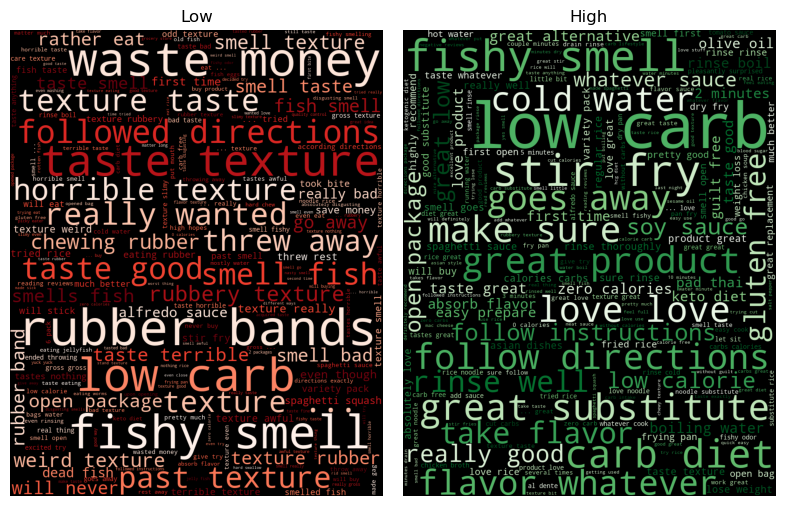

In [98]:
group_texts = get_groups_freqs_wordclouds(df,ngrams=ngram_n, as_freqs=True, 
                                          group_col='target-rating', text_col = text_col_selection,
                                         stopwords=stopwords_list) #testing stopwords
# preview_group_freqs(group_texts)
fig = make_wordclouds_from_freqs(group_texts,stopwords=stopwords_list, )
fig.savefig(FPATHS['readme']['wordclouds-by-group_png'], dpi=300, bbox_inches='tight')

In [99]:
# # fn.get_groups_freqs_wordclouds(df, ngrams=1,)
# ## ADDING MORE STOPWORDS FOR EDA
# from wordcloud import STOPWORDS
# stopwords_list = [*STOPWORDS, 'angel','hair','miracle','noodle','shirataki','pasta']

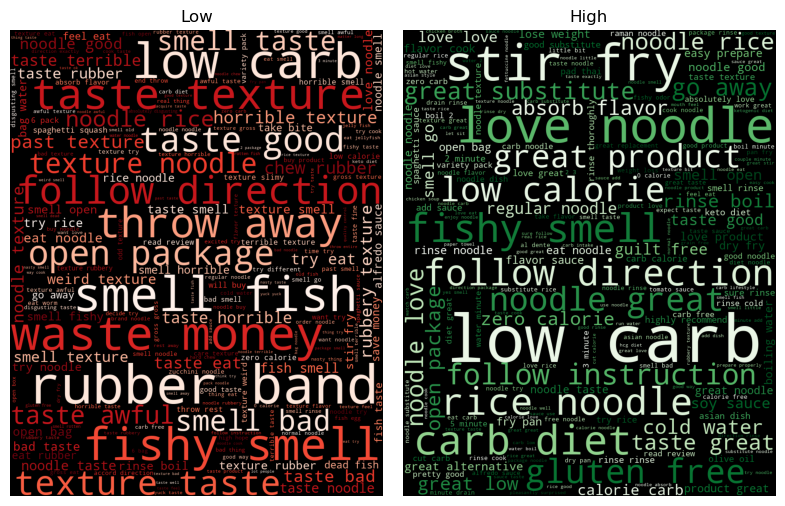

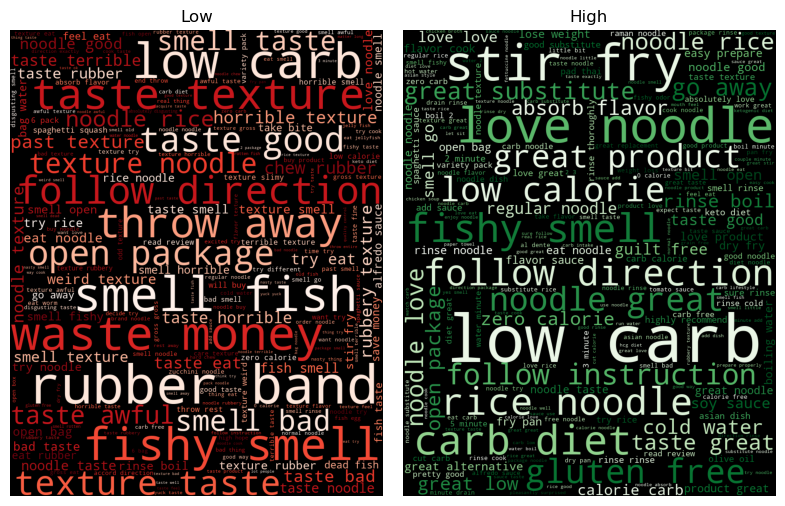

In [100]:
group_texts = get_groups_freqs_wordclouds(df,ngrams=ngram_n, as_freqs=True, 
                                          group_col='target-rating', text_col='lemmas',#text_col = text_col_selection,
                                         stopwords=stopwords_list) #testing stopwords
# preview_group_freqs(group_texts)
make_wordclouds_from_freqs(group_texts,stopwords=stopwords_list)

## NGrams

In [101]:
def get_groups_freqs_wordclouds(df, ngrams=1, group_col='target-rating', text_col='review-text-full', 
                                as_freqs=True, as_tokens=False, tokenizer=nltk.casual_tokenize, 
                                drop_groups=[], stopwords=[*STOPWORDS]):
    """Get frequencies or raw texts for word clouds by group."""
    if len(drop_groups) == 0:
        # Filter out unwanted groups upfront
        df_filtered = df[~df[group_col].isin(drop_groups)]
    else:
        df_filtered=df    
    # Make stopwords a set
    stopwords = set(stopwords)
    
    # Initialize result dictionary
    group_texts = {}
    
    # Process each group
    for group_name, group_df in df_filtered.groupby(group_col):
        # Handle list of tokens in text_col
        joined_texts = " ".join(group_df[text_col].explode().fillna('') if isinstance(group_df[text_col].iloc[0], list) else group_df[text_col])
        
        # Tokenize if necessary
        if as_tokens or as_freqs:
            tokens = [w.lower() for w in tokenizer(joined_texts) if w.lower() not in stopwords]
            
            # Generate n-grams if requested
            if ngrams > 1:
                tokens = [" ".join(ngram) for ngram in nltk.ngrams(tokens, ngrams)]
                
            if as_freqs:
                # Calculate frequency distribution
                group_texts[group_name] = dict(nltk.FreqDist(tokens))
            else:
                group_texts[group_name] = tokens
        else:
            group_texts[group_name] = joined_texts
            
    return group_texts



In [102]:
df

,asin,reviewerID,reviewText,summary,overall,year,title,brand,category,review-text-full,review-text-full_raw,tokens-dirty,tokens,lemmas,tokens-dirty-joined,tokens-joined,lemmas-joined,target-rating
0,B007JINB0W,A3Y51NV9HU5T2,"Great pasta taste and feel, but the spell in t...",Four Stars,4,2018,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,"Four Stars: Great pasta taste and feel, but th...","Four Stars: Great pasta taste and feel, but th...","[four, stars, great, pasta, taste, and, feel, ...","[stars, great, pasta, taste, feel, spell, pack...","[star, great, pasta, taste, feel, spell, packa...",four stars great pasta taste and feel but the ...,stars great pasta taste feel spell packaged sk...,star great pasta taste feel spell package skrong,None
1,B007JINB0W,A3D7EFSRC6Y9MP,The texture just made it a little strange to e...,Okay but don't like texture,3,2014,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,Okay but don't like texture: The texture just ...,Okay but don't like texture: The texture just ...,"[okay, but, do, n't, like, texture, the, textu...","[okay, like, texture, texture, little, strange...","[okay, like, texture, texture, little, strange...",okay but do n't like texture the texture just ...,okay like texture texture little strange eat f...,okay like texture texture little strange eat f...,None
2,B007JINB0W,A4AM5KBP3I2R,The herb flavor makes the odd texture of shira...,Go for the green noodles,5,2018,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,Go for the green noodles: The herb flavor make...,Go for the green noodles: The herb flavor make...,"[go, for, the, green, noodles, the, herb, flav...","[green, noodles, herb, flavor, makes, odd, tex...","[green, noodle, herb, flavor, make, odd, textu...",go for the green noodles the herb flavor makes...,green noodles herb flavor makes odd texture sh...,green noodle herb flavor make odd texture shir...,High
3,B007JINB0W,A3GHK4IL78DB7Y,I didn't have a problem at all with a half fil...,Its an awesome substitute.,5,2018,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,Its an awesome substitute.: I didn't have a pr...,Its an awesome substitute.: I didn't have a pr...,"[its, an, awesome, substitute, i, did, n't, ha...","[awesome, substitute, problem, half, filled, b...","[awesome, substitute, problem, half, fill, bag...",its an awesome substitute i did n't have a pro...,awesome substitute problem half filled bag use...,awesome substitute problem half fill bag user ...,High
4,B007JINB0W,AH3B94LQOPPY6,They taste like whatever you cook them with.,Five Stars,5,2016,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,Five Stars: They taste like whatever you cook ...,Five Stars: They taste like whatever you cook ...,"[five, stars, they, taste, like, whatever, you...","[stars, taste, like, cook]","[star, taste, like, cook]",five stars they taste like whatever you cook t...,stars taste like cook,star taste like cook,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4358,B007JINB0W,A73IG1ED6S0JR,Product arrived with two of the bags punctured...,would not recomend,1,2016,"Miracle Noodle Zero Carb, Gluten Free Shiratak...",Miracle Noodle,Grocery & Gourmet Food; Pasta & Noodles; Noodl...,would not recomend: Product arrived with two o...,would not recomend: Product arrived with two o...,"[would, not, recomend, product, arrived, with,...","[recomend, product, arrived, bags, punctured, ...","[recomend, product, arrive, bag, puncture, sme...",would not recomend product arrived with two of...,recomend product arrived bags punctured smells...,recomend product arrive bag puncture smell bad,Low
4359,B007JINB0W,A1XZ2H0MYG54M0,Ok.,Fiv

In [103]:
# Testing function - tokens
group_tokens = get_groups_freqs_wordclouds(df, as_freqs=False, as_tokens=True,
                                                stopwords=[*STOPWORDS,'go'] #testing stopwords
                                          )

In [104]:
# gr

In [105]:
# # Calculate Bigrams
# top_n = 25
# df_bigrams = fn.compare_ngram_measures_df(
#     low_review_tokens_list,
#     high_review_tokens_list,
#     ngrams=2,
#     min_freq=2,
#     top_n=top_n,
#     group1_name="Low Ratings",
#     group2_name="High Ratings",
# )
# # Save to markdown for README
# df_bigrams.to_markdown(FPATHS['eda']['bigrams']['ngram-table_md'])
# df_bigrams

In [106]:
## Add creating ngrams
st.subheader('N-Grams')
# ngrams=3
text_col_selection='review-text-full'

# ngrams = st.radio('n-grams', [2,3,4],horizontal=True,index=1)
top_n = st.selectbox('Compare Top # Ngrams',[10,15,20,25],index=2)
print(top_n)


# @st.cache_data
def show_ngrams(df, top_n, ngrams, text_col_selection, stopwords_list,
                 grp1_key="Low", grp2_key="High",measure='raw_freq' ,
               min_freq=1):

    group_texts = fn.get_groups_freqs_wordclouds(df, ngrams=1, #grp1_key=grp1_key, grp2_key =grp2_key,
                                              as_freqs=False, as_tokens=True, group_col='target-rating', 
                                              text_col = text_col_selection,
                                         stopwords=stopwords_list) #testing stopwords
    try:
        return  fn.compare_ngram_measures_df(group_texts[grp1_key], group_texts[grp2_key],
                                             measure=measure, ngrams=ngrams,min_freq=min_freq,top_n=top_n,
                                            group1_name=grp1_key, group2_name=grp2_key)
    except Exception as e:
        display(e)
        # return group_texts
## Test Code for Making New Trigrams for both groups

20


In [107]:
# fn.get_groups_freqs_wordclouds(df, ngrams=1,)
## ADDING MORE STOPWORDS FOR EDA
from wordcloud import STOPWORDS
from string import punctuation
stopwords_list = [*STOPWORDS, *punctuation, 'one','five','star','angel','hair','miracle','noodle','shirataki','pasta']

In [108]:
ngrams_df = show_ngrams(df,top_n, ngram_n,text_col_selection,stopwords_list=stopwords_list)#GROUPS=GROUPS,ngrams=ngrams,top_n=top_n)
# st.dataframe(ngrams_df, hide_index=True, width=1000, height=None)
# st.divider()
ngrams_df

Low                         High          
                  Words  Raw Freq              Words  Raw Freq
0             two stars  0.003168           low carb  0.004624
1          rubber bands  0.001893       love noodles  0.002379
2           waste money  0.001700           stir fry  0.001803
3           fishy smell  0.001622        fishy smell  0.001727
4              low carb  0.001584        stars great  0.001554
5         taste texture  0.001468          carb diet  0.001401
6   followed directions  0.001043   great substitute  0.001343
7         really wanted  0.000966       rice noodles  0.001266
8            taste good  0.000927      great product  0.001209
9      horrible texture  0.000889          make sure  0.001209
10         past texture  0.000889  follow directions  0.001170
11           smell fish  0.000889          goes away  0.001132
12        texture taste  0.000889         stars love  0.001113
13      rubbery texture  0.000850         cold water  0.001094
14          texture ...  0.000850      noodles great  0.001094
15           threw away  0.000850    flavor whatever  0.001055
16         love noodles  0.000811       noodles rice  0.001036
17       chewing rubber  0.000773        take flavor  0.001036
18      texture noodles  0.000773       noodles love  0.001017
19        smell texture  0.000695        gluten free  0.000978

In [109]:
ngrams_df.columns.get_level_values(0)

Index(['Low', 'Low', 'High', 'High'], dtype='object')

In [110]:
ngrams_df.columns

MultiIndex([( 'Low',    'Words'),
            ( 'Low', 'Raw Freq'),
            ('High',    'Words'),
            ('High', 'Raw Freq')],
           )

In [111]:
ngrams_df

Low                         High          
                  Words  Raw Freq              Words  Raw Freq
0             two stars  0.003168           low carb  0.004624
1          rubber bands  0.001893       love noodles  0.002379
2           waste money  0.001700           stir fry  0.001803
3           fishy smell  0.001622        fishy smell  0.001727
4              low carb  0.001584        stars great  0.001554
5         taste texture  0.001468          carb diet  0.001401
6   followed directions  0.001043   great substitute  0.001343
7         really wanted  0.000966       rice noodles  0.001266
8            taste good  0.000927      great product  0.001209
9      horrible texture  0.000889          make sure  0.001209
10         past texture  0.000889  follow directions  0.001170
11           smell fish  0.000889          goes away  0.001132
12        texture taste  0.000889         stars love  0.001113
13      rubbery texture  0.000850         cold water  0.001094
14          texture ...  0.000850      noodles great  0.001094
15           threw away  0.000850    flavor whatever  0.001055
16         love noodles  0.000811       noodles rice  0.001036
17       chewing rubber  0.000773        take flavor  0.001036
18      texture noodles  0.000773       noodles love  0.001017
19        smell texture  0.000695        gluten free  0.000978

In [112]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

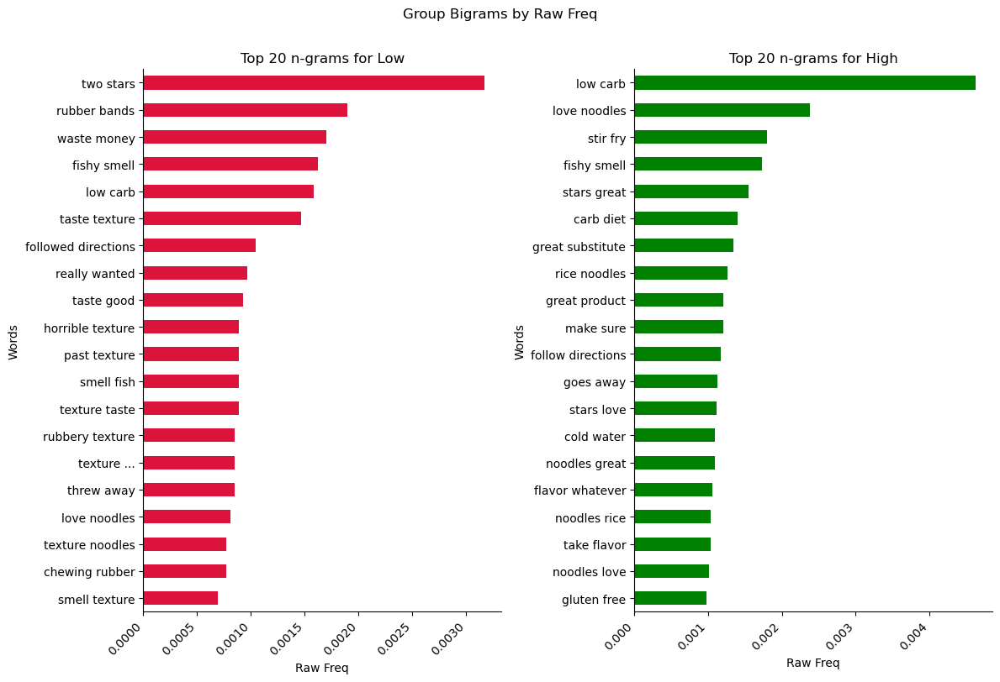

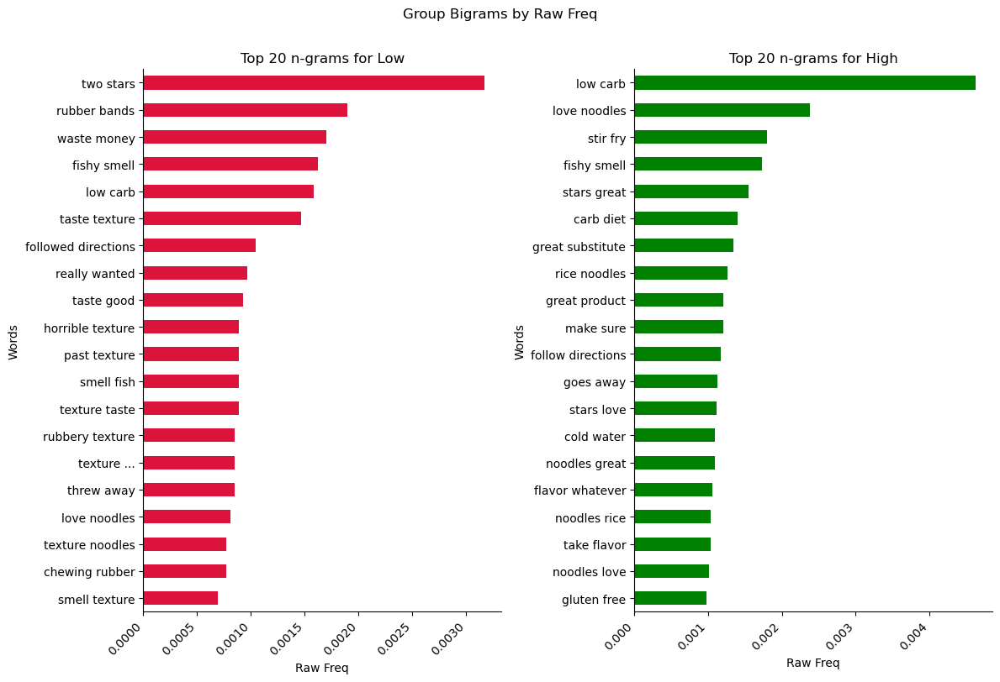

In [113]:
fig = fn.plot_group_ngrams(ngrams_df,)
fig

In [114]:
type(fig)

matplotlib.figure.Figure

#### Making PLotly version

In [115]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# # Sample data for the first subplot
# categories1 = ['A', 'B', 'C', 'D']
# values1 = [10, 20, 30, 40]

# # Sample data for the second subplot
# categories2 = ['W', 'X', 'Y', 'Z']
# values2 = [100, 200, 300, 400]

# def 
ngrams_df
mi_colname_1 = "Low"
mi_colname_2 = "High"

group_1_data = ngrams_df[mi_colname_1]
group_2_data = ngrams_df[mi_colname_2]
group_1_data

,Words,Raw Freq
0,two stars,0.003168
1,rubber bands,0.001893
2,waste money,0.001700
3,fishy smell,0.001622
4,low carb,0.001584
5,taste texture,0.001468
6,followed directions,0.001043
7,really wanted,0.000966
8,taste good,0.000927
9,horrible texture,0.000889


In [116]:

# colors = fn.mute_colors_by_key()
muted_colors = fn.mute_colors_by_key(colors,keys_to_mute=[2,3,4])
muted_colors

{1: 'red', 2: '#804600', 3: '#808000', 4: '#004000', 5: 'limegreen'}

In [117]:
# Get the column names and then sort by value col
# Create a subplot figure with 1 row and 2 columns


def plotly_group_ngrams_df(
    ngrams_df,
    mi_colname_1="Low",
    mi_colname_2="High",
    color_1 = "red",
    color_2 = "green",
    height=600,
    width=1000,
    title="Top n-grams per Group",
    show=False,
):
    fig = make_subplots(
        rows=1,
        cols=2,
        subplot_titles=(mi_colname_1, mi_colname_2),
        horizontal_spacing=0.1
        # margin=dict(l=40, r=40, t=40, b=40),
        # Optional titles
    )

    
    # Set color list for indexing with i
    col_color_list = [color_1, color_2]
    # Slice the columns for the current group
    for i, group_name in enumerate([mi_colname_1, mi_colname_2]):
        group_data = ngrams_df[group_name]
        word_col, val_col = group_data.columns

        # Sort values so bars appear in correct order
        group_data = group_data.sort_values(by=val_col)

        # Add to the fifugre
        fig.add_trace(
            go.Bar(
                x=group_data[val_col],
                y=group_data[word_col],
                orientation="h",
                marker=dict(color=col_color_list[i]),
                name=group_name,
            ),
            row=1,
            col=i + 1,
        )

    # Update layout if necessary (optional)
    fig.update_layout(
        height=height,
        width=width,
        showlegend=False,  # overwrite=True,
        title_text=title,
    )
    fig.update_yaxes(automargin=True)  # , autorange='left+width+right')#,row=1,col=1)

    # Show plot
    if show == True:
        fig.show()
    return fig

In [118]:
# automargin
# Code: fig.update_xaxes(automargin=<VALUE>)
# Type: flaglist string. Any combination of "height", "width", "left", "right", "top", "bottom" joined with a "+" OR True or False.
# Examples: "height", "width", "height+width", "height+width+left", "True"
# Determines whether long tick labels automatically grow the figure margins.

In [119]:
import plotly.io as pio
# pio.templates.default='streamlit'
pio.templates.default='plotly_dark'

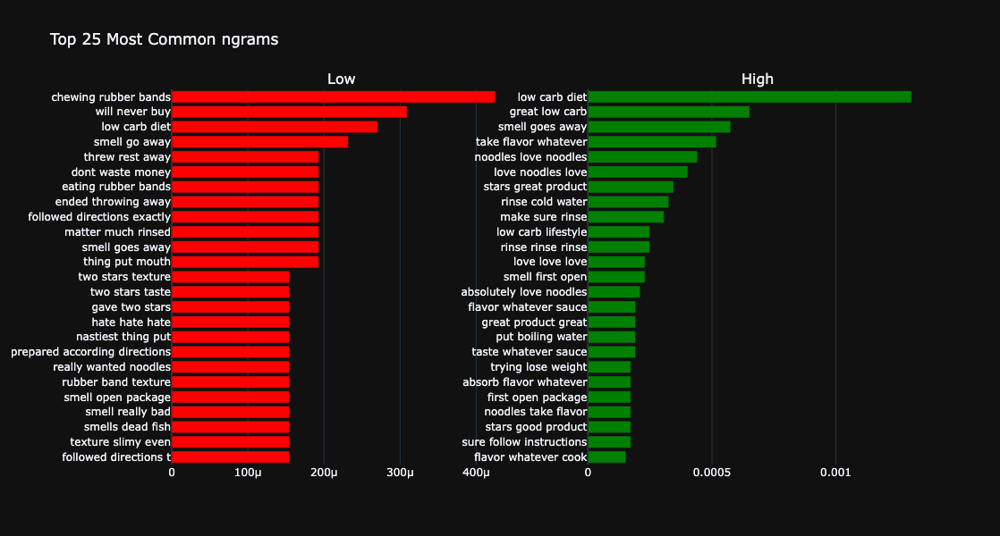

In [120]:
ngram_n=3
top_n=25
ngrams_df = fn.show_ngrams(df,top_n, ngram_n,text_col_selection,stopwords_list=stopwords_list)#GROUPS=GROUPS,ngrams=ngrams,top_n=top_n)
# with pio.templates.
pfig = plotly_group_ngrams_df(ngrams_df,show=False, title=f"Top {top_n} Most Common ngrams")
pfig


In [121]:
FPATHS['readme']

{'histogram-reviews-dist_png': 'images/01_histogram_reviews.png',
 'avg-reviews-by-year_png': 'images/02_avg_rating_by_year.png',
 'number-reviews-stars-by-year_png': 'images/03_count_stars_by_year.png',
 'ngrams-by-group_png': 'images/04_ngrams_by_group.png',
 'wordclouds-by-group_png': 'images/05_wordclouds.png'}

In [122]:
fname_ngram = FPATHS['readme']['ngrams-by-group_png']
# pfig#.#to_image()
with open(fname_ngram,'wb') as f:
    f.write(pfig.to_image('png'))

# Modeling App


### Prep

- Decide best models
- Save best models (FPATHS keys) as a var somewhere
- Use new evaluation function to save the classification report and confusion matrices.
- in app, load the string and image to display

In [123]:
best_ml_model = FPATHS['models']['ml']['logreg_joblib']
best_ml_clf = joblib.load(best_ml_model)
best_ml_clf

Pipeline(steps=[('vectorizer',
                 TfidfVectorizer(ngram_range=(1, 2), stop_words='english')),
                ('clf', LogisticRegression(C=1000000000000.0, max_iter=500))])

### APP

In [124]:
import json
with open('config/filepaths.json') as f:
    FPATHS = json.load(f)
FPATHS['models']

{'ml': {'bayes_joblib': 'models/bayes-clf.joblib',
  'random_forest_joblib': 'models/random-forest.joblib',
  'logreg_joblib': 'models/log-reg.joblib'},
 'nn': {'LSTM_dir': 'models/keras/lstm/',
  'GRU_dir': 'models/keras/gru/',
  'Attention_model_dir': 'models/keras/attn/'}}

In [125]:
"""App for NLP Models for Streamlit Lesson"""
import streamlit as st
import streamlit.components.v1 as components
import pandas as pd
import numpy as np
import os
import joblib
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np
import json

with open('config/filepaths.json') as f:
    FPATHS = json.load(f)

st.title("Predicting Yelp Review Classifications")
st.header("Get Predictions")

# Get text to predict from the text input box
X_to_pred = st.text_input("### Enter text to predict here:", 
                          value="I've tried many low carb noodles over the years and I have to say that I was shocked with how bad these miracle noodles were!.")

In [126]:
X_to_pred

"I've tried many low carb noodles over the years and I have to say that I was shocked with how bad these miracle noodles were!."

In [127]:
# Loading the ML model
# @st.cache_resource
def load_ml_model(fpath):
    loaded_model = joblib.load(fpath)
    return loaded_model

In [128]:
best_ml_model = FPATHS['models']['ml']['logreg_joblib']
best_ml_clf = joblib.load(best_ml_model)
best_ml_clf

Pipeline(steps=[('vectorizer',
                 TfidfVectorizer(ngram_range=(1, 2), stop_words='english')),
                ('clf', LogisticRegression(C=1000000000000.0, max_iter=500))])

In [129]:
# Load encoder and make lookup dict
encoder_fpath = FPATHS['metadata']['label_encoder_joblib']
@st.cache_data
def load_target_lookup(encoder_fpath = FPATHS['metadata']['label_encoder_joblib']):
    # Load encoder and make lookup dict
    encoder = joblib.load(encoder_fpath)

    lookup_dict = {i:class_ for i,class_ in enumerate(encoder.classes_)}
    return encoder, lookup_dict


encoder, target_lookup = load_target_lookup()

2024-02-12 20:38:15.568 No runtime found, using MemoryCacheStorageManager
2024-02-12 20:38:15.569 No runtime found, using MemoryCacheStorageManager


In [130]:
## Loading our training and test data
@st.cache_data
def load_Xy_data(joblib_fpath):
    return joblib.load(joblib_fpath)

X_train, y_train = load_Xy_data(FPATHS['data']['ml-nlp']['train_joblib'])
X_test, y_test = load_Xy_data(FPATHS['data']['ml-nlp']['test_joblib'])

2024-02-12 20:38:15.617 No runtime found, using MemoryCacheStorageManager
2024-02-12 20:38:15.618 No runtime found, using MemoryCacheStorageManager


In [131]:

def classification_metrics_streamlit(y_true, y_pred, label='',
                           output_dict=False, figsize=(8,4),
                           normalize='true', cmap='Blues',
                           colorbar=False,values_format=".2f"):
    """Modified version of classification metrics function from Intro to Machine Learning.
    Updates:
    - Reversed raw counts confusion matrix cmap  (so darker==more).
    - Added arg for normalized confusion matrix values_format
    """
    # Get the classification report
    report = classification_report(y_true, y_pred)
    
    ## Save header and report
    header = "-"*70
    final_report = "\n".join([header,f" Classification Metrics: {label}", header,report,"\n"])
    
    
    ## CONFUSION MATRICES SUBPLOTS
    fig, axes = plt.subplots(ncols=2, figsize=figsize)
    
    # Create a confusion matrix  of raw counts (left subplot)
    ConfusionMatrixDisplay.from_predictions(y_true, y_pred,
                                            normalize=None, 
                                            cmap='gist_gray_r',# Updated cmap
                                            values_format="d", 
                                            colorbar=colorbar,
                                            ax = axes[0]);
    axes[0].set_title("Raw Counts")
    
    # Create a confusion matrix with the data with normalize argument 
    ConfusionMatrixDisplay.from_predictions(y_true, y_pred,
                                            normalize=normalize,
                                            cmap=cmap, 
                                            values_format=values_format, #New arg
                                            colorbar=colorbar,
                                            ax = axes[1]);
    axes[1].set_title("Normalized Confusion Matrix")
    
    # Adjust layout and show figure
    fig.tight_layout()

    return final_report, fig


In [132]:
# best_ml_clf.get_params()
display(best_ml_clf)

Pipeline(steps=[('vectorizer',
                 TfidfVectorizer(ngram_range=(1, 2), stop_words='english')),
                ('clf', LogisticRegression(C=1000000000000.0, max_iter=500))])

In [133]:
def evaluate_classification_streamlit(model, X_train, y_train, X_test, y_test,
                                     joblib_fpath, cmap_train="Blues",cmap_test="Reds"):
    ## Save ML Model Results
    y_hat_train = model.predict(X_train)
    report_train, fig_train = classification_metrics_streamlit(y_train, y_hat_train, cmap=cmap_train,
                                                            label="Training Data")
    print(report_train)
    plt.show()
    y_hat_test = model.predict(X_test)
    report_test, fig_test = classification_metrics_streamlit(y_test, y_hat_test,cmap=cmap_test,
                                                             label="Test Data")
    print(report_test)
    plt.show()


    results_dict = {
        "model": model,
        "train": {"classification_report": report_train, "confusion_matrix": fig_train},
        "test": {"classification_report": report_test, "confusion_matrix": fig_test},
    }
    
    joblib.dump(results_dict, joblib_fpath, compress=9)
    print(f"- Succesfully saved model to {joblib_fpath}.")
    return results_dict

In [134]:
fpath_best_ml = FPATHS['results']['best-ml-clf_joblib']
fpath_best_ml

'models/best-ml-clf.joblib'

----------------------------------------------------------------------
 Classification Metrics: Training Data
----------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1376
           1       1.00      1.00      1.00      1102

    accuracy                           1.00      2478
   macro avg       1.00      1.00      1.00      2478
weighted avg       1.00      1.00      1.00      2478





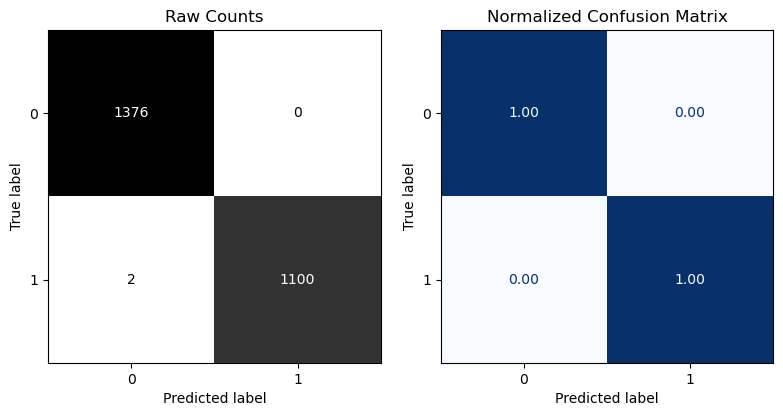

----------------------------------------------------------------------
 Classification Metrics: Test Data
----------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.95      0.95       492
           1       0.92      0.94      0.93       335

    accuracy                           0.94       827
   macro avg       0.94      0.94      0.94       827
weighted avg       0.94      0.94      0.94       827





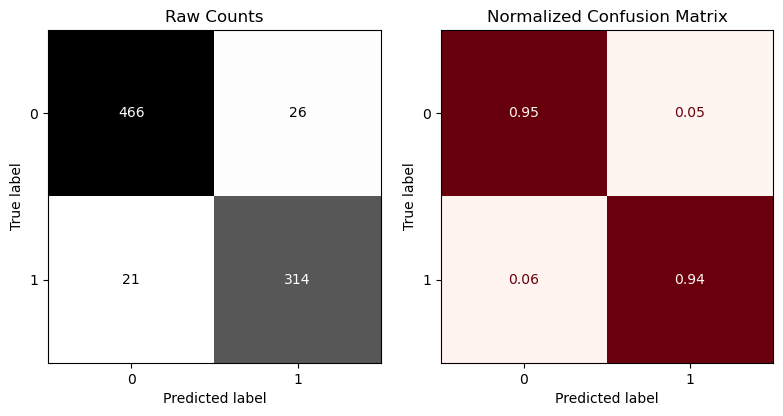

- Succesfully saved model to models/best-ml-clf.joblib.


In [135]:
results = evaluate_classification_streamlit(best_ml_clf, X_train,y_train, X_test,y_test,
                                           joblib_fpath=fpath_best_ml)

In [136]:
def get_coeffs_logreg(logreg, feature_names = None, sort=True,ascending=True,
                      name='LogReg Coefficients', class_index=0):
    if feature_names is None:
        feature_names = logreg.feature_names_in_ 
    
    ## Saving the coefficients
    coeffs = pd.Series(logreg.coef_[class_index],
                       index= feature_names, name=name)
    
    # use .loc to add the intercept to the series
    coeffs.loc['intercept'] = logreg.intercept_[class_index]
    if sort == True:
        coeffs = coeffs.sort_values(ascending=ascending)  
    return coeffs



def plot_coeffs_color(coeffs, top_n=None,  figsize=(8,6), legend_loc='best',
                      threshold=None, color_lt='darkred', color_gt='forestgreen',
                      color_else='gray', label_thresh='Equally Likely',
                      label_gt='More Likely', label_lt='Less Likely',
                   plot_kws = {}):
    """Plots series of coefficients
        Args:
        ceoffs (pands Series): importance values to plot
        top_n (int): The # of features to display (Default=None).
                         If None, display all.
                        otherwise display top_n most important
                        
        figsize (tuple): figsize tuple for .plot
        color_dict (dict): dict with index values as keys with color to use as vals
                            Uses series.index.map(color_dict).
        plot_kws (dict): additional keyword args accepted by panda's .plot
        
         
         Returns:
        Axis: matplotlib axis
    """
    # sorting with asc=false for correct order of bars
    if top_n is None:
        ## sort all features and set title
        plot_vals = coeffs.sort_values()
        title = "All Coefficients"
    else:
        ## rank the coeffs and select the top_n
        coeff_rank = coeffs.abs().rank().sort_values(ascending=False)
        top_n_features = coeff_rank.head(top_n)
        plot_vals = coeffs.loc[top_n_features.index].sort_values()
        ## sort features and keep top_n and set title
        title = f"Top {top_n} Largest Coefficients"
        ## plotting top N importances
    if threshold is not None:
        color_dict = get_colors_gt_lt(plot_vals, threshold=threshold,
                                      color_gt=color_gt,color_lt=color_lt,
                                      color_else=color_else)
        ## Getting color list and saving to plot_kws
        colors = plot_vals.index.map(color_dict)
        plot_kws.update({'color':colors})
    
    
    ax = plot_vals.plot(kind='barh', figsize=figsize,**plot_kws)
    ax.set(xlabel='Coefficient',
            ylabel='Feature Names',
            title=title)
    
    if threshold is not None:
        ln1 = ax.axvline(threshold,ls=':',color='black')
        from matplotlib.patches import Patch
        box_lt = Patch(color=color_lt)
        box_gt = Patch(color=color_gt)
        handles = [ln1,box_gt,box_lt]
        labels = [label_thresh,label_gt,label_lt]
        ax.legend(handles,labels, loc=legend_loc)
    ## return ax in case want to continue to update/modify figure
    return ax


In [137]:
# ## Plot top 20 ranked coefficients (ranked by abs value, but plot +/-)
# coeffs = get_coeffs_logreg(best_ml_clf[-1], feature_names=best_ml_clf[0].get_feature_names_out(),
#                           class_index=0)
# ax = plot_coeffs_color(coeffs, top_n=20)
# ax.axvline(0, color='k');
# ax.set_title('Top 20 Largest Coefficients - 5 Star Reviews')

In [138]:
@st.cache_resource
def load_best_model_results(fpath_results_joblib):
    import joblib
    return joblib.load(fpath_results_joblib)

In [139]:
# ## Save ML Model Results
# y_hat_train = best_ml_clf.predict(X_train)
# report_train, fig_train = classification_metrics_streamlit(y_train, y_hat_train)

# y_hat_test = best_ml_clf.predict(X_test)
# report_test, fig_test = classification_metrics_streamlit(y_test, y_hat_test,cmap="Reds")

In [140]:
# results_dict = {
#     "model": best_ml_clf,
#     "train": {"classification_report": report_train, "confusion_matrix": fig_train},
#     "test": {"classification_report": report_test, "confusion_matrix": fig_test},
# }

# joblib.dump(results_dict, fpath_best_ml, compress=9)


In [806]:
# # Define functions for predictions
# lookup_dict = {1:'One Star', 5:'Five Stars'}

def predict_decode(X_to_pred, clf_pipe,lookup_dict):
    
    if isinstance(X_to_pred, str):
        X = [X_to_pred]
    else:
        X = X_to_pred

    # Get Predixtion
    pred_class = clf_pipe.predict(X)[0]
    
    # In case the predicted class is missing from the lookup dict
    try:
        # Decode label
        class_name = lookup_dict[pred_class]
    except:
        class_name = pred_class
    return class_name

In [807]:
# target_lookup = load_target_lookup()
# target_lookup

In [828]:
## Lime Explanation Fucntions
from lime.lime_text import LimeTextExplainer
@st.cache_resource
def get_explainer(class_names = None):
	lime_explainer = LimeTextExplainer(class_names=class_names)
	return lime_explainer

def explain_instance(explainer, X_to_pred,predict_func):
	explanation = explainer.explain_instance(X_to_pred, predict_func, labels=(1,))
	return explanation.as_html(predict_proba=False)

# @st.cache_data
# def load_target_lookup(encoder_fpath = FPATHS['metadata']['label_encoder_joblib']):
#     # Load encoder and make lookup dict
#     encoder = joblib.load(encoder_fpath)

#     lookup_dict = {i:class_ for i,class_ in enumerate(encoder.classes_)}
#     return lookup_dict



In [829]:
X_to_pred

"I've tried many low carb noodles over the years and I have to say that I was shocked with how bad these miracle noodles were!."

In [830]:
pred = predict_decode(X_to_pred, best_ml_clf,lookup_dict=target_lookup,)
pred

'High'

In [831]:
encoder.classes_

array(['High', 'Low'], dtype=object)

In [832]:
best_ml_clf.predict([X_to_pred])

array([0])

In [833]:
from IPython.display import HTML
explainer = get_explainer(class_names=encoder.classes_)
# explanation_ml = explainer.explain_instance(X_to_pred, best_ml_clf.predict_proba)
explanation_ml = explain_instance(explainer,X_to_pred, best_ml_clf.predict_proba)


# explanation_ml = explain_instance(explainer, X_to_pred, best_ml_clf.predict_proba )#lime_explainer.explain_instance(X_to_pred, best_ml_clf.predict_proba,labels=label_index_ml)
HTML(explanation_ml)

In [514]:
col1,col2,col3 = st.columns(3)
show_train = col1.checkbox("Show training data.", value=True)
show_test = col2.checkbox("Show test data.", value=True)
show_model_params =col3.checkbox("Show model params.", value=False)

# show_train = st.checkbox("Show training data.", value=True)
# show_test = st.checkbox("Show test data.",value=True)
# show_model_params =st.checkbox("Show model params.", value=False)

# st.subheader("Machine Learning Model")
if st.button("Show model evaluation."):
    with st.spinner("Loading model results..."):
        results = load_best_model_results(FPATHS['results']['best-ml-clf_joblib'])
        
    if show_train == True:
        # y_pred_train = clf_bayes_pipe.predict(X_train)
        # report_str, conf_mat = classification_metrics_streamlit(y_train, y_pred_train, label='Training Data')
        st.text(results['train']['classification_report'])
        st.pyplot(results['train']['confusion_matrix'])
        st.text("\n\n")


    if show_test == True: 
        # y_pred_test = clf_bayes_pipe.predict(X_test)
        # report_str, conf_mat = classification_metrics_streamlit(y_test, y_pred_test, cmap='Reds',label='Test Data')
        st.text(results['test']['classification_report'])
        st.pyplot(results['test']['confusion_matrix'])
        st.text("\n\n")

    if show_model_params:
        st.markdown("####  Model Parameters:")
        st.write(resuts['model'].get_params())

else:
    st.empty()

### SImple Chat GPT

In [834]:
flavor_options = {
    "Summary(General)": {'prompt':"You are a helpful assistant data scientist who uses ngrams from product reviews to summarize that customers do and do not like.",
                         'placeholder': ""},
    "Summary(Recommendations)": {'prompt':"You are a helpful assistant data scientist who uses ngrams from product reviews to provide actionable recommendations for how to improve the product.",
                                 'placeholder':''},
    "Customer (Low Carb/Gluten Free)": {'prompt':"You are a typical consumer who follows a low carb diet and has gluten sensitivity. You know what things you like in your food products.",
                                        "placeholder":''},
    "Customer (General)":  {'prompt':"You are a typical consumer who does not follow a special diet and enjoys eating gluten-containing foods. You know what things you like in your food products.",
                            "placeholder":""},
}

In [835]:
@st.cache_resource
def load_chatgpt(temp,flavor_name):
    top_n_group_ngrams = fn.show_ngrams(df, top_n=25,ngrams=4, text_col_selection='review-text-full',
                                     stopwords_list=chatgpt_stopwords)
    md_table = format_ngrams_for_chat(top_n_group_ngrams)
    table_message = f"Heres a table of the most common ngrams from Low Rating reviews and high rating reviews. ```{md_table}```" 
    
    # Clear message history and specify flavor
    st.session_state.session_messages = [
    SystemMessage(content=flavor_options[flavor_name]['prompt']),
    SystemMessage(content=table_message)
    ]
    return  ChatOpenAI(temperature=temp)
     

In [ ]:
flavor_name = col1.selectbox("Which type of chatbot?", key='flavor',options=list(flavor_options.keys()), index=0,on_change=set_placeholder())



In [ ]:
def set_placeholder():
    text = flavor_options[flavor_name]['placeholder']
    st.session.placeholder = text
    get_text()
    # st.session_state.text = st.session_state.text.upper()


def get_text():
    input_text = st.text_area("You: ", key='input', value =st.session_state.placeholder)#"Please give me a summary of what customers liked  and did not like about this product.")
    return input_text


st.text_area("Enter text", key="text")
st.button("Upper Text", on_click=on_upper_clicked)
